<a href="https://colab.research.google.com/github/DATA601-CustSegment-Nov2025-to-Feb2026/New-CustSegment-Project/blob/Benjamin_Clustering/Customer_Segmentation_(Clustering_Algorithms_Model_1_Model_32_Benjamin).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries & Load Datasets

In [1]:
# Install necessary libraries
!pip install git+https://github.com/FelSiq/DBCV
!pip install hdbscan

# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib, os
import dbcv
import hdbscan
import plotly.express as px
import warnings

from functools import reduce
from sklearn.preprocessing import PowerTransformer, StandardScaler, RobustScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import linkage, dendrogram

from google.colab import drive

  Cloning https://github.com/FelSiq/DBCV to /tmp/pip-req-build-e8vswpae
  Running command git clone --filter=blob:none --quiet https://github.com/FelSiq/DBCV /tmp/pip-req-build-e8vswpae
  Resolved https://github.com/FelSiq/DBCV to commit 13c3896ef78d12f1e3e1cbd394f2db9a09637ffd
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for dbcv: filename=dbcv-0.1.1-py3-none-any.whl size=6667 sha256=ac6efecc90838ac1ca3c75c6b5f0bf9e9ecf5b94af21590e9e57bc768385f597
  Stored in directory: /tmp/pip-ephem-wheel-cache-u_vz9f95/wheels/e4/c0/55/b233329a5a47c9f54996729cf3c8166850a51f37b0aa911081
Successfully built dbcv


/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Paths to the household profile dataset stored in Google Drive
household_profile_path = '/content/drive/MyDrive/0. Colab Notebooks (DATA 60X Project)/2. Preprocessed Datasets/customer_segmentation_after_preprocessing.csv'

# Read the dataset from its CSV file
household_profile_df = pd.read_csv(household_profile_path, low_memory=False)

# Create a copy to inverse the scaling, transformation and encoding
inverse_household_profile_df = household_profile_df.copy()

In [4]:
# Show all columns
pd.set_option('display.max_columns', None)

# Display first 5 rows of the dataset
household_profile_df.head(5)

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511
4,16,0.0,0.000000,-0.5,0.0,1.192513,-0.448174,-1.235709,-1.055914,-1.273896,1.273896,-0.300252,-0.607878,0.607878,0.115384,-0.968430,0.085717,1.146129,0.813866,0.126961,1.618363,-3.908189,0.492382,-0.492382,0.152564,2.071352,0.166213,1.415026,1.086591,-0.864491,1.165722,1.238202,1.401472,-3.320718


# Check Correlation Between Variables

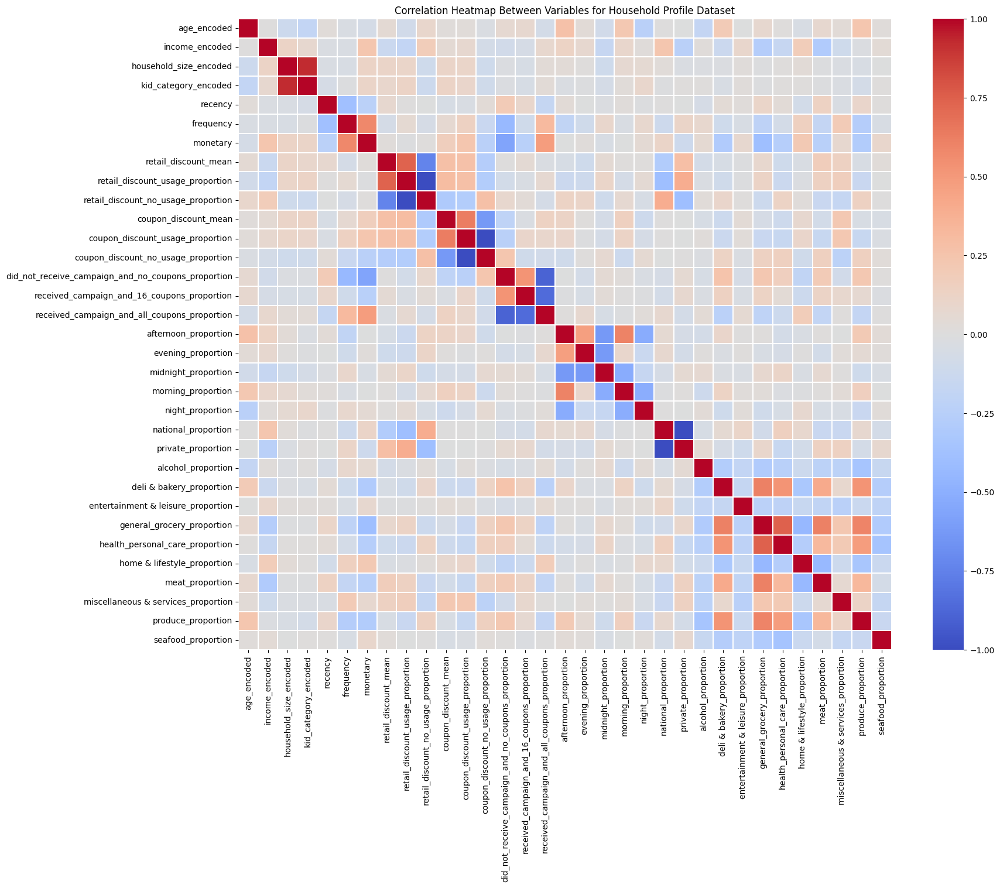

In [5]:
# Selecting columns (exclude household_key) for correlation  checking
corr_variables = inverse_household_profile_df.drop(columns=['household_key'])

# Compute correlation matrix
corr_matrix = corr_variables.corr(method='pearson')

# Plot correlation heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    linewidths=0.3
)
plt.title('Correlation Heatmap Between Variables for Household Profile Dataset')
plt.show()

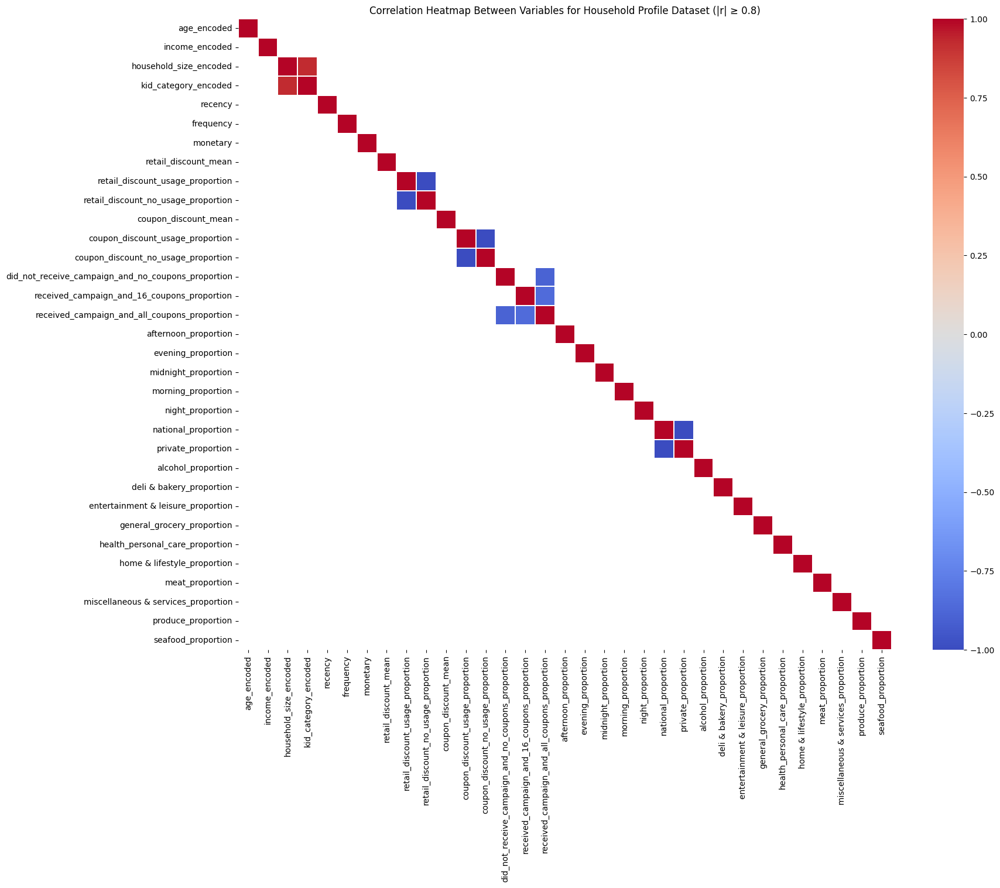

In [6]:
# Mask strong correlations (|r| ≥ 0.8)
# Absolute correlation values
mask = corr_matrix.abs() < 0.8

# Plot correlation heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap='coolwarm',
    center=0,
    linewidths=0.3
)
plt.title('Correlation Heatmap Between Variables for Household Profile Dataset (|r| ≥ 0.8)')
plt.show()

In [7]:
# Identify and list feature pairs with strong correlations (|r| ≥ 0.8)
# Absolute correlation values
corr_abs = corr_matrix.abs()

# Remove self-correlations
corr_abs = corr_abs.where(~np.eye(corr_abs.shape[0], dtype=bool))

# Keep only strong correlations
strong_corr = (
    corr_abs
    .stack()
    .reset_index()
)

strong_corr.columns = ['Variable 1', 'Variable 2', 'Correlation']

# Keep only strong correlations (|r| ≥ 0.8)
strong_corr = strong_corr[strong_corr['Correlation'] >= 0.8]

# Sort correlations in descending order
strong_corr = strong_corr.sort_values('Correlation', ascending=False)

strong_corr.head(50)

,Variable 1,Variable 2,Correlation
296,retail_discount_no_usage_proportion,retail_discount_usage_proportion,1.000000
264,retail_discount_usage_proportion,retail_discount_no_usage_proportion,1.000000
725,private_proportion,national_proportion,1.000000
693,national_proportion,private_proportion,1.000000
363,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,1.000000
395,coupon_discount_no_usage_proportion,coupon_discount_usage_proportion,1.000000
66,household_size_encoded,kid_category_encoded,0.924278
98,kid_category_encoded,household_size_encoded,0.924278
493,received_campaign_and_all_coupons_proportion,did_not_receive_campaign_and_no_coupons_propor...,0.892169
430,did_not_receive_campaign_and_no_coupons_propor...,received_campaign_and_all_coupons_proportion,0.892169


- Dropping perfectly correlated variables (|r| = 1) because these two variables are exactly linearly dependent.

- We will drop 'retail_discount_no_usage_proportion', 'coupon_discount_no_usage_proportion', and 'private_proportion' before clustering because they add zero new information but add noise and redundancy.

- Keeping highly correlated variables for clustering algorithms because each variable may contain some unique variance that helps distinguish clusters.


# Inverse Scaling, Transformation, and Encoding

In [8]:
# Set the location of the fitted objects
save_dir = '/content/drive/MyDrive/0. Colab Notebooks (DATA 60X Project)/2. Preprocessed Datasets/'

# Load the previously fitted objects
robust_scaler = joblib.load(f'{save_dir}/robust_scaler.pkl')
yeo_johnson_transformation = joblib.load(f'{save_dir}/yeo_johnson_transformation.pkl')

In [9]:
# Drop household_key because it is just an identifier
inverse_robust_scale_cols = inverse_household_profile_df.drop(
    columns=['household_key']
)

# Apply the fitted RobustScaler to reverse the scaling for all selected columns
inverse_robust_scale = robust_scaler.inverse_transform(inverse_robust_scale_cols )

# Convert the inverse-transformed array back into a new dataframe: 'inverse_household_profile_df'
inverse_household_profile_df = pd.DataFrame(
    inverse_robust_scale,
    columns=inverse_robust_scale_cols.columns,
    index=household_profile_df.index
)

# Add 'household_key' back to the 'inverse_household_profile_df'
inverse_household_profile_df['household_key'] = household_profile_df['household_key'].values

# Move household_key to the first column of the 'inverse_household_profile_df'
inverse_household_profile_df = inverse_household_profile_df[
    ['household_key'] + inverse_robust_scale_cols.columns.tolist()
]
# Display first 5 rows of the dataset
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,1.417809,3.293642,11.224266,0.229628,-0.121615,0.121615,0.004519,-1.363680,1.363680,0.620271,-0.030580,-0.589691,5.841657,4.048005,-7.483846,5.078030,-7.483846,1.007944,-1.007944,-7.403495,3.702803,-7.403495,5.994899,4.204895,-1.042129,3.676370,1.665921,4.007727,-7.403495
1,7,3.0,4.0,1.0,0.0,0.949495,3.093050,10.804470,0.220551,-0.112447,0.112447,0.002695,-1.921118,1.921118,1.177101,-0.625152,-0.551949,3.825838,3.332578,-9.375729,-0.080454,2.297768,0.200142,-0.200142,-7.981876,2.387912,-7.981876,5.395766,4.085986,-1.325660,2.817475,0.466100,3.461832,-1.325660
2,8,1.0,2.0,2.0,1.0,1.417809,3.432961,11.657452,0.266581,0.019709,-0.019709,0.000848,-2.200046,2.200046,0.550434,-0.063555,-0.486878,2.617577,3.053119,-9.869078,2.357500,1.840882,0.590237,-0.590237,-1.355270,1.325752,-9.189871,4.257858,2.313407,-0.399759,1.947947,-0.131495,2.116696,-0.885266
3,13,1.0,5.0,3.0,2.0,0.949495,3.852607,13.248418,0.294569,0.036643,-0.036643,0.004709,-0.960418,0.960418,0.402524,0.014948,-0.417472,1.232640,1.663564,-3.136808,0.647382,-0.406778,0.417983,-0.417983,-8.305458,1.332251,-8.305458,5.066608,3.833231,-0.641830,2.203079,2.792157,2.484930,-0.459509
4,16,3.0,4.0,0.0,0.0,2.089554,3.360920,9.446411,0.205179,-0.317830,0.317830,0.000000,-3.123053,3.123053,1.607420,-1.069024,-0.538396,5.523018,4.404284,-7.569901,5.212500,-7.569901,0.654166,-0.654166,-6.818094,4.719661,-6.818094,6.584180,4.360287,-6.818094,4.245877,2.828811,4.533559,-6.818094


In [10]:
# Columns to inverse Yeo-Johnson transformation
columns_to_inverse_yeo_johnson_transformation = [
    'recency',
    'frequency',
    'monetary',
    'retail_discount_mean',
    'coupon_discount_mean'
]

# Directly inverse-transform and overwrite the same columns in 'inverse_household_profile_df'
inverse_household_profile_df[columns_to_inverse_yeo_johnson_transformation] = yeo_johnson_transformation.inverse_transform(
    inverse_household_profile_df[columns_to_inverse_yeo_johnson_transformation]
)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,5.0,86.0,4330.16,0.403613,-0.121615,0.121615,0.015142,-1.363680,1.363680,0.620271,-0.030580,-0.589691,5.841657,4.048005,-7.483846,5.078030,-7.483846,1.007944,-1.007944,-7.403495,3.702803,-7.403495,5.994899,4.204895,-1.042129,3.676370,1.665921,4.007727,-7.403495
1,7,3.0,4.0,1.0,0.0,2.0,59.0,3400.05,0.375202,-0.112447,0.112447,0.004005,-1.921118,1.921118,1.177101,-0.625152,-0.551949,3.825838,3.332578,-9.375729,-0.080454,2.297768,0.200142,-0.200142,-7.981876,2.387912,-7.981876,5.395766,4.085986,-1.325660,2.817475,0.466100,3.461832,-1.325660
2,8,1.0,2.0,2.0,1.0,5.0,113.0,5534.97,0.544871,0.019709,-0.019709,0.000935,-2.200046,2.200046,0.550434,-0.063555,-0.486878,2.617577,3.053119,-9.869078,2.357500,1.840882,0.590237,-0.590237,-1.355270,1.325752,-9.189871,4.257858,2.313407,-0.399759,1.947947,-0.131495,2.116696,-0.885266
3,13,1.0,5.0,3.0,2.0,2.0,275.0,13190.92,0.693011,0.036643,-0.036643,0.033113,-0.960418,0.960418,0.402524,0.014948,-0.417472,1.232640,1.663564,-3.136808,0.647382,-0.406778,0.417983,-0.417983,-8.305458,1.332251,-8.305458,5.066608,3.833231,-0.641830,2.203079,2.792157,2.484930,-0.459509
4,16,3.0,4.0,0.0,0.0,21.0,98.0,1512.02,0.331315,-0.317830,0.317830,0.000000,-3.123053,3.123053,1.607420,-1.069024,-0.538396,5.523018,4.404284,-7.569901,5.212500,-7.569901,0.654166,-0.654166,-6.818094,4.719661,-6.818094,6.584180,4.360287,-6.818094,4.245877,2.828811,4.533559,-6.818094


In [11]:
# Grouping proportions of retail discount usage vs non-usage
retail_discount_groups = [
    ['retail_discount_usage_proportion', 'retail_discount_no_usage_proportion']
]

# Grouping proportions of coupon usage vs non-usage
coupon_discount_groups = [
    ['coupon_discount_usage_proportion', 'coupon_discount_no_usage_proportion']
]

# Grouping proportions of campaign exposure and coupon receipt
campaign_groups = [
    ['did_not_receive_campaign_and_no_coupons_proportion',
     'received_campaign_and_16_coupons_proportion',
     'received_campaign_and_all_coupons_proportion']
]

# Grouping proportions of purchases by time of day
time_of_day_groups = [
    ['morning_proportion', 'afternoon_proportion', 'evening_proportion',
     'midnight_proportion', 'night_proportion']
]

# Grouping proportions of brand type purchased
brand_groups = [
    ['national_proportion', 'private_proportion']
]

# Grouping proportions of product categories purchased
product_groups = [
    ['alcohol_proportion', 'deli & bakery_proportion', 'entertainment & leisure_proportion',
     'general_grocery_proportion', 'health_personal_care_proportion', 'home & lifestyle_proportion',
     'meat_proportion', 'miscellaneous & services_proportion', 'produce_proportion', 'seafood_proportion']
]

# Combine all groups into a single list for processing
all_groups = retail_discount_groups + coupon_discount_groups + campaign_groups + time_of_day_groups + brand_groups + product_groups


# Define a function to reverse Centered Log-Ratio transformation
def inverse_clr(df, groups, total_sum=1):
    df_inverse = df.copy()

    for cols in groups:
        # Exponentiate CLR values
        exp_vals = np.exp(df[cols].values)

        # Normalize to original sum
        exp_vals /= exp_vals.sum(axis=1).reshape(-1, 1)
        exp_vals *= total_sum

        # Replace the CLR columns with original scale
        df_inverse[cols] = exp_vals

    return df_inverse


inverse_household_profile_df = inverse_clr(inverse_household_profile_df, all_groups)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,3.0,4.0,1.0,0.0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,1.0,2.0,2.0,1.0,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,1.0,5.0,3.0,2.0,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,3.0,4.0,0.0,0.0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [12]:
# Convert encoded columns from float to integer to ensure correct mapping back to original categories
inverse_household_profile_df['age_encoded'] = inverse_household_profile_df['age_encoded'].astype(int)
inverse_household_profile_df['income_encoded'] = inverse_household_profile_df['income_encoded'].astype(int)
inverse_household_profile_df['household_size_encoded'] = inverse_household_profile_df['household_size_encoded'].astype(int)
inverse_household_profile_df['kid_category_encoded'] = inverse_household_profile_df['kid_category_encoded'].astype(int)

# Age - Inverse Ordinal Encoding
age_order = ['19-24', '25-34', '35-44', '45-54', '55-64', '65+']
age_mapping = {age: i for i, age in enumerate(age_order)}
inverse_age_mapping = {v: k for k, v in age_mapping.items()}
inverse_household_profile_df['age_encoded'] = inverse_household_profile_df['age_encoded'].map(inverse_age_mapping)

# Income - Inverse Ordinal Encoding
income_order = [
    'Under 15K', '15-24K', '25-34K', '35-49K', '50-74K',
    '75-99K', '100-124K', '125-149K', '150-174K',
    '175-199K', '200-249K', '250K+'
]
income_mapping = {income: i for i, income in enumerate(income_order)}
inverse_income_mapping = {v: k for k, v in income_mapping.items()}
inverse_household_profile_df['income_encoded'] = inverse_household_profile_df['income_encoded'].map(inverse_income_mapping)

# Household Size - Inverse Ordinal Encoding
household_size_order = ['1', '2', '3', '4', '5+']
household_size_mapping = {size: i for i, size in enumerate(household_size_order)}
inverse_household_size_mapping = {v: k for k, v in household_size_mapping.items()}
inverse_household_profile_df['household_size_encoded'] = inverse_household_profile_df['household_size_encoded'].map(inverse_household_size_mapping)

# Kid Category - Inverse Ordinal Encoding
kid_order = ['0', '1', '2', '3+']
kid_mapping = {kid: i for i, kid in enumerate(kid_order)}
inverse_kid_mapping = {v: k for k, v in kid_mapping.items()}
inverse_household_profile_df['kid_category_encoded'] = inverse_household_profile_df['kid_category_encoded'].map(inverse_kid_mapping)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,25-34,75-99K,4,2,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,45-54,50-74K,1,0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [13]:
# Add 'inverse_' prefix to all columns except 'household_key'
inverse_household_profile_df.rename(
    columns=lambda x: f"inverse_{x}" if x != 'household_key' else x,
    inplace=True
)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,25-34,75-99K,4,2,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,45-54,50-74K,1,0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [14]:
# Merge with the original 'household_profile_df' with 'inverse_household_profile_df'
household_profile_df = household_profile_df.merge(inverse_household_profile_df, on='household_key', how='left')

# Display first 5 rows
household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [15]:
# Display the shape of the household profile datatset
household_profile_df.shape

(801, 67)

# Recency, Frequency & Monetary (RFM)

## Model 1: K-Means

In [ ]:
# Display first 5 rows of the dataset
household_profile_df[['recency', 'frequency', 'monetary']].head()

,recency,frequency,monetary
0,0.489861,-0.621099,-0.087203
1,0.000000,-1.136685,-0.358394
2,0.489861,-0.263006,0.192638
3,0.000000,0.815617,1.220412
4,1.192513,-0.448174,-1.235709


In [ ]:
# Extract recency, frequency, and monetary variables from house_profile dataset and converts them into NumPy array.
rfm_array = household_profile_df[['recency', 'frequency', 'monetary']].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [ ]:
# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_kmeans_results_df' for comparison across different k.
rfm_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(rfm_array)

    rfm_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert results to DataFrame
rfm_kmeans_results_df = pd.DataFrame(rfm_kmeans_results)
rfm_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,822.815902,0.325478,1.157449,506.671391
1,3,637.381110,0.291321,1.162451,442.711950
2,4,497.151696,0.299797,1.030296,452.851786
3,5,444.609795,0.275533,1.133561,402.816147
4,6,403.169314,0.243059,1.188323,371.272909
5,7,370.100167,0.238279,1.209922,348.439319
6,8,341.624473,0.250736,1.151627,332.592197
7,9,316.967518,0.243156,1.166946,320.962218
8,10,295.748045,0.249778,1.143140,311.689394


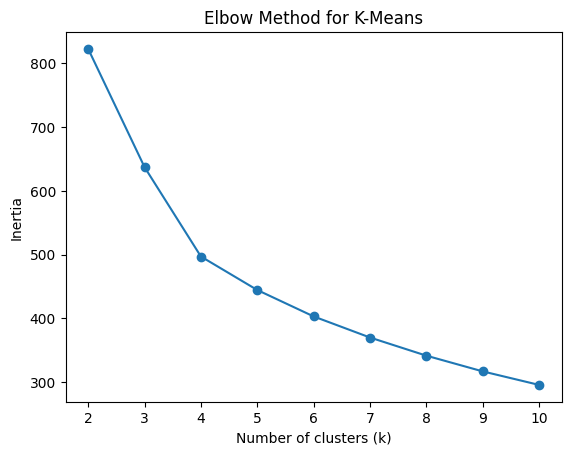

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(rfm_kmeans_results_df['k'], rfm_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx =rfm_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.325478 at k = 2.0
Best Davies-Bouldin Index: 1.030296 at k = 4.0
Best Calinski-Harabasz Index: 506.671391 at k = 2.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4.

- Based on Silhouette score, the highest value (0.325478) is at k=2, which provides the best clustering. Then, the second highest value (0.2998) is at k=4.

- Based on Davies-Bouldin Index (DBI), the lowest value (1.030296) is at k = 4, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (506.67) is at k=2, which provides the strongest clustering.

- The best k is 4 based on the elbow method and the combination of validation metrics, as k=2 is too simple to capture cluster structure and identify more subtle behaviours.

In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
rfm_kmeans_cluster_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [ ]:
# Fit final K-Means model using k=4
final_k = 4
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(rfm_array)

# Add cluster labels to the rfm_kmeans_cluster_df
rfm_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_kmeans_cluster_df.head(5)

Silhouette Score for k=4: 0.299797
Davies-Bouldin Index for k=4: 1.030296
Calinski-Harabasz Index for k=4: 452.851786


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,4
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,4
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on RFM variables
rfm_cols_of_interest = ['inverse_frequency', 'inverse_recency', 'inverse_monetary']

# Group by cluster and calculate count, median, and mean
rfm_kmeans_cluster_summary = rfm_kmeans_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_kmeans_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
1,226,158.0,172.371681,5.0,9.765487,5816.680,6292.381947
2,184,279.0,324.277174,0.0,0.711957,9100.755,10035.097717
3,195,122.0,130.835897,1.0,0.758974,3194.170,3446.835333
4,196,80.0,82.668367,8.0,17.760204,2729.005,2842.076888


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_kmeans_cluster_proportion = rfm_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_kmeans_cluster_proportion)

cluster
1    0.282147
2    0.229713
3    0.243446
4    0.244694
Name: proportion, dtype: float64


The cluster balance looks good because each cluster has about 23-28% of the total customers. No cluster is extremely small or dominating the dataset.

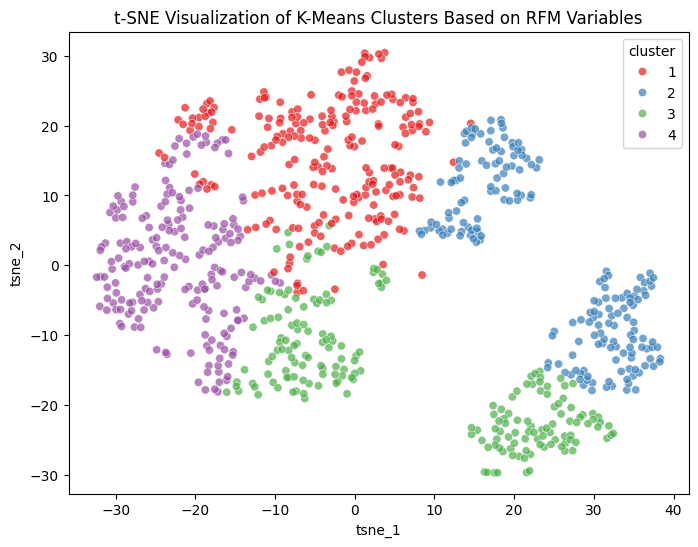

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_kmeans_cluster_df'
rfm_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on RFM Variables')
plt.show()

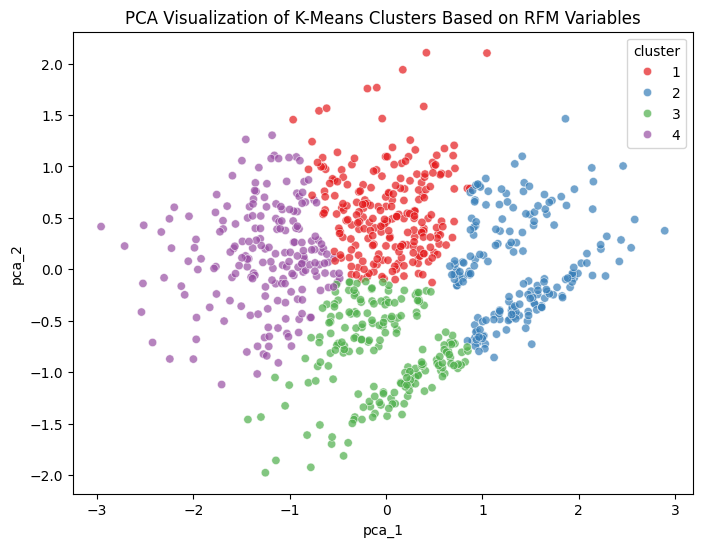

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
rfm_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend
rfm_kmeans_cluster_df['cluster_str'] = rfm_kmeans_cluster_df['cluster'].apply(lambda x: f'Cluster {x}')

# Define custom colors
custom_colors = {
    'Cluster 1': 'red',
    'Cluster 2': 'dodgerblue',
    'Cluster 3': 'green',
    'Cluster 4': 'purple'

}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_kmeans_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of K-Means Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

In [ ]:
rfm_kmeans_cluster_df['cluster_str'].value_counts()

,count
cluster_str,
Cluster 1,226
Cluster 4,196
Cluster 3,195
Cluster 2,184


## Model 2: Hierarchical Clustering (Ward Linkage)

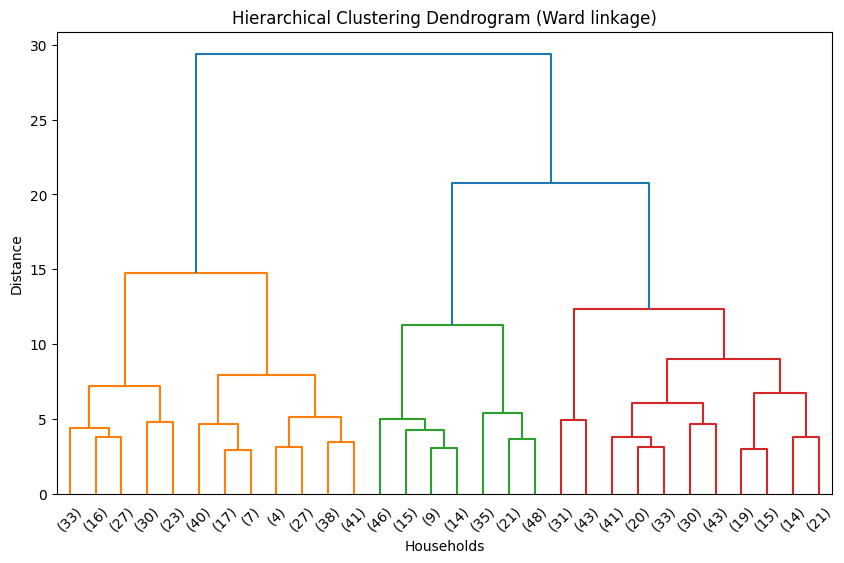

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Perform hierarchical clustering using Ward linkage.
rfm_hierarchical_ward = linkage(rfm_array, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_ward_results' for comparison across different k.
rfm_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(rfm_array)

    rfm_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_ward_results_df = pd.DataFrame(rfm_hierarchical_ward_results)
rfm_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.278791,1.273301,379.225560
1,3,0.249608,1.237899,371.749404
2,4,0.221314,1.230946,342.639658
3,5,0.206718,1.240613,324.909901
4,6,0.194200,1.134367,319.432795
5,7,0.209796,1.250221,305.476049
6,8,0.214774,1.258108,292.791698
7,9,0.220786,1.277590,282.008433
8,10,0.222094,1.200146,273.851407


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.278791 at k = 2.0
Best Davies-Bouldin Index: 1.134367 at k = 6.0
Best Calinski-Harabasz Index: 379.225560 at k = 2.0


k=2 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- Silhouette score is the highest at k=2 (0.279)
- Calinski-Harabasz index is the highest at k=2 (379.23)

In [ ]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_ward_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical ward clustering model using k=2
final_k = 2
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=2: 0.278791
Davies-Bouldin Index for k=2: 1.273301
Calinski-Harabasz Index for k=2: 379.225560


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_ward_cluster_summary = rfm_hierarchical_ward_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_hierarchical_ward_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
1,498,109.0,117.461847,3.0,9.656627,3308.155,3525.569016
2,303,229.0,270.108911,2.0,3.821782,8354.550,9049.448482


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_ward_cluster_proportion = rfm_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_ward_cluster_proportion)

cluster
1    0.621723
2    0.378277
Name: proportion, dtype: float64


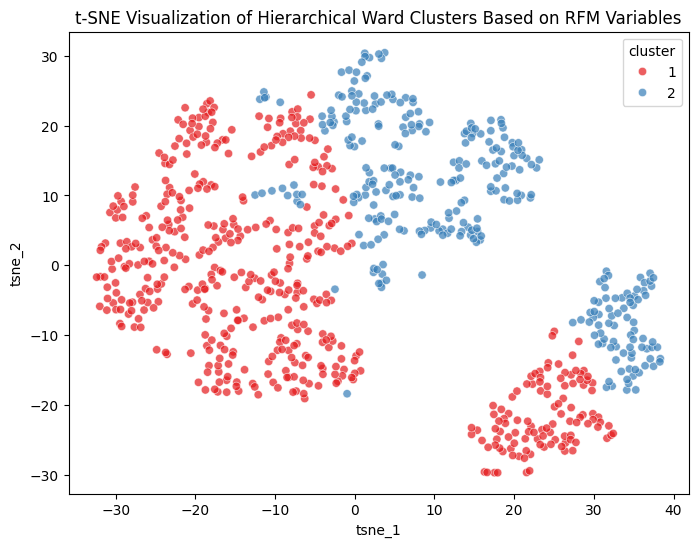

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on RFM Variables')
plt.show()

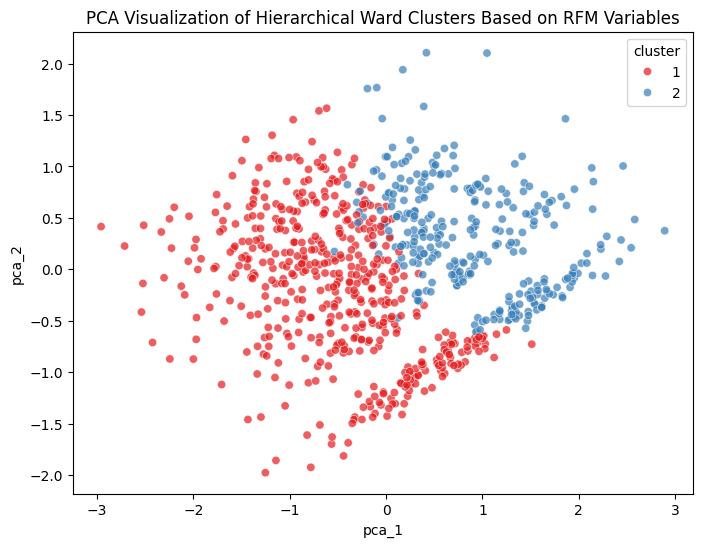

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on RFM Variables')
plt.show()

## Model 3: Hierarchical Clustering (Average Linkage)

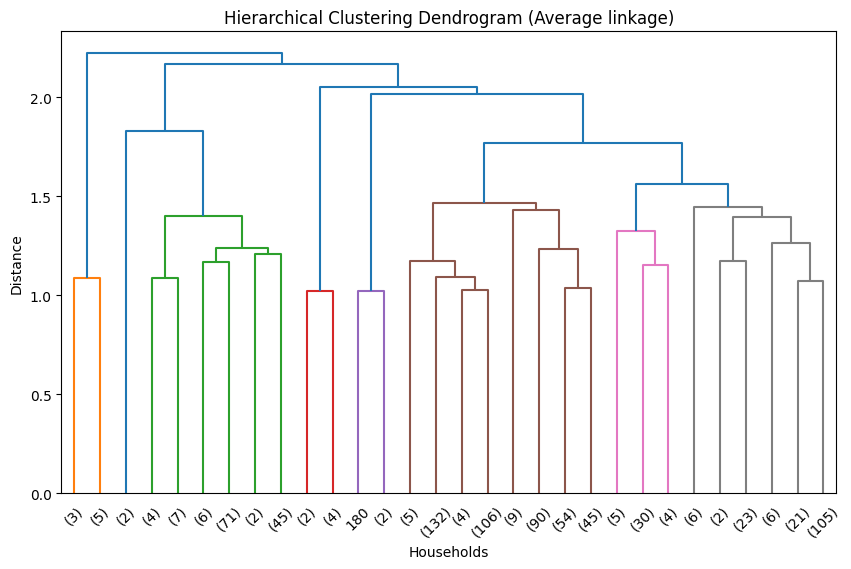

In [ ]:
# Perform hierarchical clustering using Average linkage.
rfm_hierarchical_average = linkage(rfm_array, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=7

In [ ]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_average_results' for comparison across different k.
rfm_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(rfm_array)

    rfm_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_average_results_df = pd.DataFrame(rfm_hierarchical_average_results)
rfm_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.222591,0.951227,16.148563
1,3,0.223344,0.939667,175.681705
2,4,0.129575,0.925148,124.413772
3,5,0.102203,0.920576,95.888730
4,6,0.078004,0.869374,78.066089
5,7,0.153185,0.945204,140.159315
6,8,0.146824,0.938225,139.948977
7,9,0.207634,0.976994,187.352318
8,10,0.191779,0.977192,170.801060


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.223344 at k = 3.0
Best Davies-Bouldin Index: 0.869374 at k = 6.0
Best Calinski-Harabasz Index: 187.352318 at k = 9.0


k=3 was selected for hierarchical average clustering based on its balanced performance:
- Silhouette score is the highest at k=3 (0.223)
- Davies-Bouldin index is the fourth lowest at k=3 (0.940)
- Calinski-Harabasz index is the second highest at k =3 (175.7)

In [ ]:
# Create a copy of the dataset to add hierarchical average cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_average_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical average clustering model using k=3
final_k = 3
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=3
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=3: 0.223344
Davies-Bouldin Index for k=3: 0.939667
Calinski-Harabasz Index for k=3: 175.681705


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_average_cluster_summary = rfm_hierarchical_average_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_hierarchical_average_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
1,656,123.5,135.559451,3.0,8.202744,3959.390,4406.538293
2,8,222.0,289.875000,63.0,60.250000,8602.745,9298.247500
3,137,321.0,358.343066,0.0,0.759124,10427.210,11187.161752


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_average_cluster_proportion = rfm_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_average_cluster_proportion)

cluster
1    0.818976
2    0.009988
3    0.171036
Name: proportion, dtype: float64


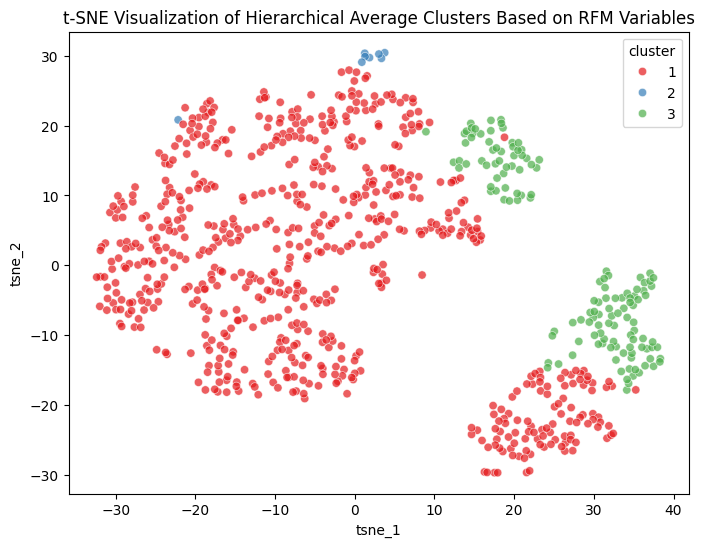

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on RFM Variables')
plt.show()

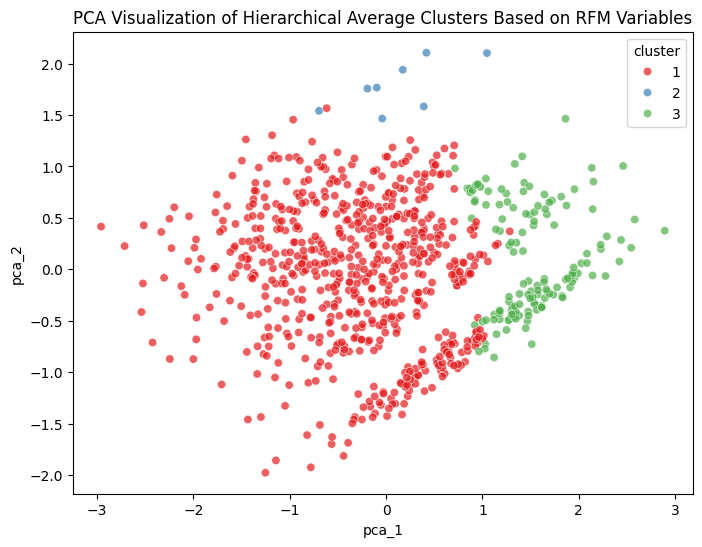

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on RFM Variables')
plt.show()

## Model 4: Hierarchical Clustering (Complete Linkage)

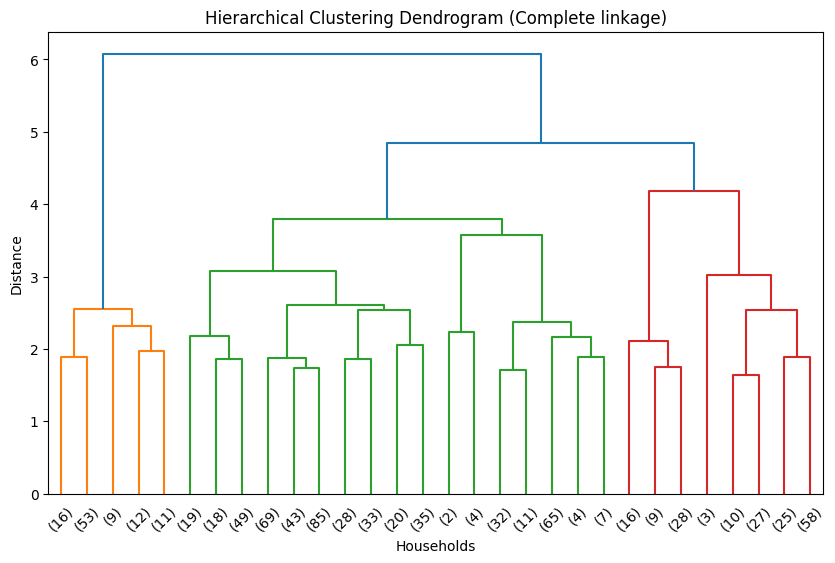

In [ ]:
# Perform hierarchical clustering using Complete linkage.
rfm_hierarchical_complete = linkage(rfm_array, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_complete_results' for comparison across different k.
rfm_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(rfm_array)

    rfm_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_complete_results_df = pd.DataFrame(rfm_hierarchical_complete_results)
rfm_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.259792,1.006788,218.455468
1,3,0.132547,1.917112,165.161790
2,4,0.098108,1.256089,193.719387
3,5,0.120215,1.255829,227.848543
4,6,0.122865,1.221088,192.750605
5,7,0.148649,1.259780,208.961193
6,8,0.142751,1.178411,183.708425
7,9,0.162119,1.359363,192.704082
8,10,0.149658,1.363406,183.812625


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.259792 at k = 2.0
Best Davies-Bouldin Index: 1.006788 at k = 2.0
Best Calinski-Harabasz Index: 227.848543 at k = 5.0


k=2 was selected for hierarchical complete clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- Silhouette score is the highest at k=2 (0.260)
- Davies-Bouldin index is the lowest at k=2(1.007)
- Calinski-Harabasz index is the second highest at k=2 (218.455)

In [ ]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_complete_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.259792
Davies-Bouldin Index for k=2: 1.006788
Calinski-Harabasz Index for k=2: 218.455468


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_complete_cluster_summary = rfm_hierarchical_complete_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_hierarchical_complete_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
1,700,154.5,190.277143,2.0,4.915714,5144.305,6038.642300
2,101,66.0,70.742574,16.0,25.009901,2590.370,2679.867822


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_complete_cluster_proportion = rfm_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_complete_cluster_proportion)

cluster
1    0.873908
2    0.126092
Name: proportion, dtype: float64


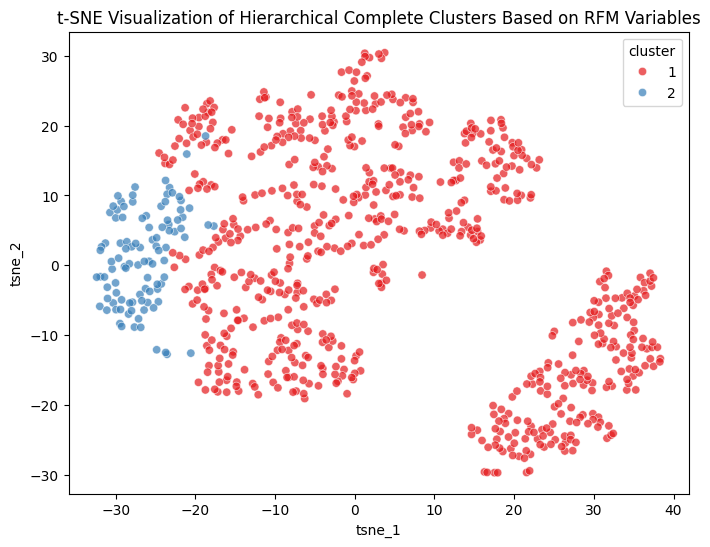

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on RFM Variables')
plt.show()

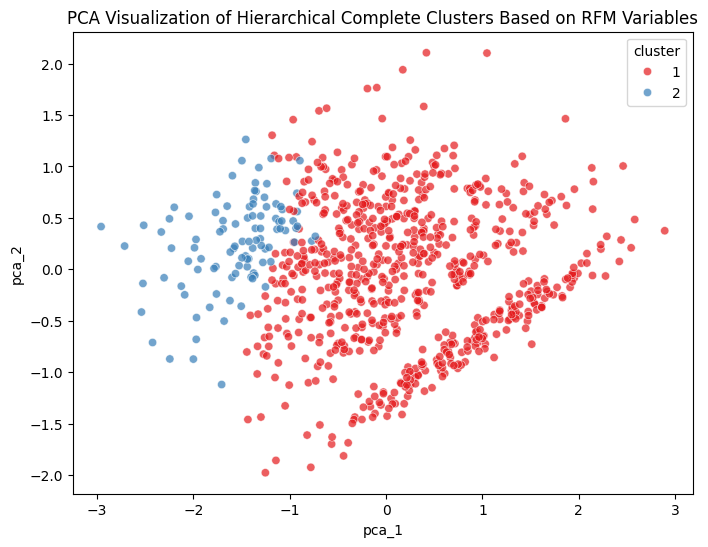

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on RFM Variables')
plt.show()

## Model 5: DBSCAN

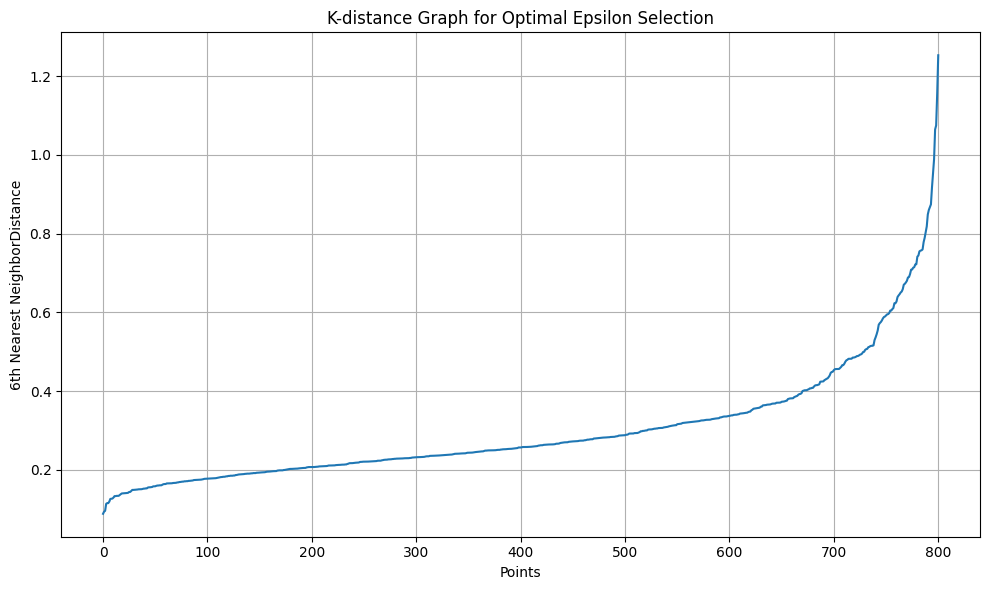

In [ ]:
# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 3 variables (recency, frequency, monetary), so n_neighbors / min_samples = 6.

# Calculate distances to the 6 nearest neighbors for each point.
# The distance to the 6th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 6
rfm_neighbors = NearestNeighbors(n_neighbors=k).fit(rfm_array)
distances, indices = rfm_neighbors.kneighbors(rfm_array)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 0.8.

In [ ]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Define parameter ranges for DBSCAN
eps_range = [0.3, 0.4, 0.5, 0.6, 0.8]
min_samples_range = [5, 6, 7]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_dbscan_results' for comparison across different eps range and minimum samples range.
rfm_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(rfm_array)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = rfm_array[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(rfm_array, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        rfm_dbscan_results.append(result)

# Convert to DataFrame
rfm_dbscan_results_df = pd.DataFrame(rfm_dbscan_results)
rfm_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,0.3,5,5,131,0.163546,-0.142627,-0.022400,1.348679,133.258619
1,0.3,6,6,159,0.198502,-0.085522,0.008156,1.260232,107.781864
2,0.3,7,5,187,0.233458,-0.143017,0.039939,1.321552,135.001394
3,0.4,5,2,59,0.073658,-0.159890,0.293847,1.220949,277.063570
4,0.4,6,2,63,0.078652,0.166078,0.294979,1.214337,278.004863
5,0.4,7,2,70,0.087391,0.167242,0.298073,1.205631,281.598758
6,0.5,5,2,26,0.032459,-0.376307,0.280374,1.264570,263.291816
7,0.5,6,2,31,0.038702,-0.285587,0.282818,1.256434,266.809163
8,0.5,7,2,37,0.046192,-0.281524,0.284928,1.249180,269.000821
9,0.6,5,2,14,0.017478,-0.578654,0.275918,1.277067,258.869409


In [ ]:
# Highest DBCV Score
best_dbcv_idx = rfm_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = rfm_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = rfm_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.167242 at eps = 0.4, min_samples = 7.0
Best Silhouette Score: 0.298073 at eps = 0.4, min_samples = 7.0
Best Davies-Bouldin Index: 1.205631 at eps = 0.4, min_samples = 7.0
Best Calinski-Harabasz Index: 281.598758 at eps = 0.4, min_samples = 7.0


Choosing an epsilon of 0.8 only creates 1 cluster, which produces NaN values for the DBCV score Silhouette score, Davies-Bouldin index and Calinski-Harabasz index. Therefore, we tested with different epsilon values (0.3, 0.4, 0.5, 0.6 & 0.8) and minimum samples values (5, 6 & 7).

eps=0.4 and min_sample = 7 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio equal to 0.087
- DBCV score is the highest at 0.1672
- Silhouette score is the highest at 0.298
- Davies-Bouldin index is the lowest at 1.206
- Calinski-Harabasz index is the highest at 281.599

In [ ]:
# Create a copy of the dataset to add DBSCAN cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_dbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 0.4
best_min_samples = 7
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_dbscan_cluster_df'
rfm_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.4 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = rfm_array[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(rfm_array, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_dbscan_cluster_df.head(5)

Number of clusters for eps=0.4 & min_samples=7: 2
Number of noise for eps=0.4 & min_samples=7: 70
Noise ratio for eps=0.4 & min_samples=7: 0.087391
DBCV Score for eps=0.4 & min_samples=7: 0.167242
Silhouette Score for eps=0.4 & min_samples=7: 0.298073
Davies-Bouldin Index for eps=0.4 & min_samples=7: 1.205631
Calinski-Harabasz Index for eps=0.4 & min_samples=7: 281.598758


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_dbscan_cluster_summary = rfm_dbscan_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_dbscan_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
0,70,121.5,260.957143,3.0,25.657143,2439.940,5497.540429
1,557,131.0,150.184919,4.0,7.488330,4528.710,5216.883321
2,174,188.0,220.798851,0.0,0.000000,5946.965,6937.266782


Note: Cluser 0 is noise.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_dbscan_cluster_proportion = rfm_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_dbscan_cluster_proportion)

cluster
0    0.087391
1    0.695381
2    0.217228
Name: proportion, dtype: float64


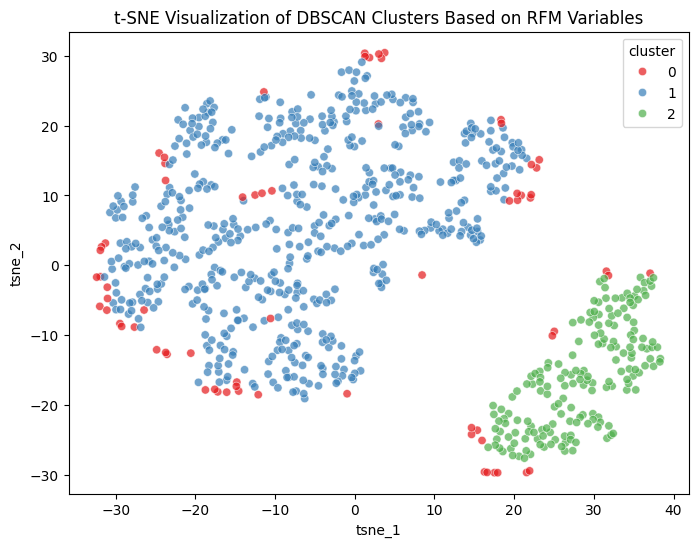

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_dbscan_cluster_df'
rfm_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

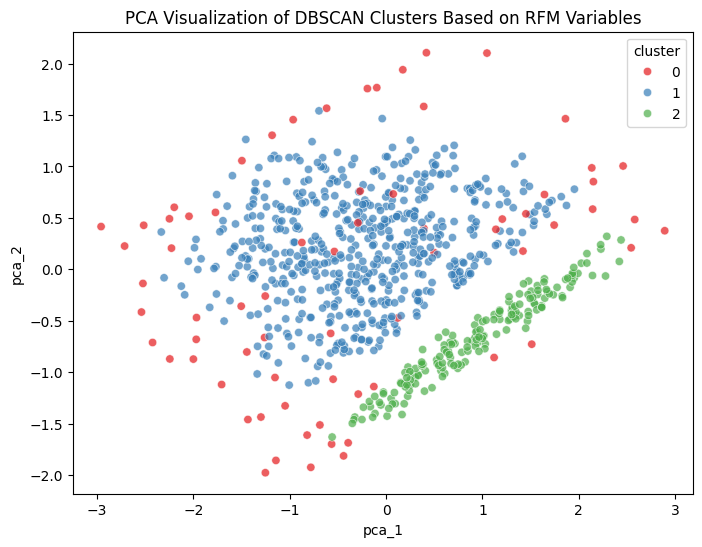

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
rfm_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend and add "(Noise)" for cluster 0
rfm_dbscan_cluster_df['cluster_str'] = rfm_dbscan_cluster_df['cluster'].apply(
    lambda x: f'Cluster {x} (Noise)' if x == 0 else f'Cluster {x}'
)

# Define custom colors
custom_colors = {
    'Cluster 0 (Noise)': 'darkblue',  # Cluster O is Noise
    'Cluster 1': 'palevioletred',
    'Cluster 2': 'orange',
}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 0 (Noise)', 'Cluster 1', 'Cluster 2']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_dbscan_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of DBSCAN Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

## Model 6: HDBSCAN

In [ ]:
# For HDBSCAN, min_cluster_size is the minimum number of points required to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 15]
min_samples_range = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Store results
rfm_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        rfm_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = rfm_hdbscan.fit_predict(rfm_array)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = rfm_array[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(rfm_array, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        rfm_hdbscan_results.append(result)

# Convert to DataFrame
rfm_hdbscan_results_df = pd.DataFrame(rfm_hdbscan_results)
rfm_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,2,5,0.006242,-0.582962,0.274537,1.313667,253.135929
1,5,5,2,34,0.042447,-0.266544,0.283176,1.252085,268.027419
2,5,10,2,64,0.079900,0.017578,0.290449,1.208879,272.074664
3,5,15,2,88,0.109863,0.138374,0.294414,1.198936,266.630546
4,5,20,2,114,0.142322,0.270020,0.301138,1.170129,267.956062
5,5,25,2,156,0.194757,0.263373,0.317944,1.131536,277.905262
6,5,30,2,182,0.227216,0.161048,0.324666,1.094266,273.931695
7,5,35,2,226,0.282147,0.260534,0.332134,1.047075,259.562870
8,5,40,2,275,0.343321,0.251375,0.343525,0.983066,247.475847
9,5,45,2,320,0.399501,0.286635,0.351422,0.937178,226.191404


**Different min_cluster_size values (5, 10, 15) when paired with the same min_samples have identical validation results.**
<br>
The validation metrics show identical results for different min_cluster_size values (5, 10, 15) when paired with the same min_samples values because the clusters formed by HDBSCAN are large enough (with many data points) to satisfy all these min_cluster_size thresholds. As a result, changing min_cluster_size within this range does not affect the clustering structure and validation results.

If a potential cluster does not satisfy the min_cluster_size requirement, HDBSCAN labels those points as noise (labeled as -1) rather than forming clusters, which affects the validation results by excluding these points from the validation calculations.
<br>
<br>

**min_samples values increases, the n_noise (number of noises) increases.**
<br>
We also noticed that when min_samples values increases, the n_noise (number of noises) increases.
- Low min_samples: Lenient clustering, more core points, less noise, but might include outliers in the clusters.
- High min_samples: Tight clusterring, less core points, more noise, but less outliers in the clusters (more robust).


For example: imagine a data point with 5 neighbors
- If min_samples = 3, this data point is a core point because it has 5 neighbors, which exceeds the requirement of 3.
- If min_samples = 8, this data point is not a core point because it has only 5 neighbors, which is less than the requirement of 8
- With higher min_samples, there are fewer core points, clusters become smaller, and more points fail to be reachable from any core point. These points are then labeled as noise.

In [ ]:
# Filter results for min_cluster_size = 5
rfm_hdbscan_mcs5_results_df = rfm_hdbscan_results_df[rfm_hdbscan_results_df['min_cluster_size'] == 5]

# Highest DBCV Score
best_dbcv_idx = rfm_hdbscan_mcs5_results_df['dbcv_score'].idxmax()
best_dbcv = rfm_hdbscan_mcs5_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = rfm_hdbscan_mcs5_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hdbscan_mcs5_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hdbscan_mcs5_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hdbscan_mcs5_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hdbscan_mcs5_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hdbscan_mcs5_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.286635 at min_cluster_size = 5.0, min_samples = 45.0
Best Silhouette Score: 0.366294 at min_cluster_size = 5.0, min_samples = 50.0
Best Davies-Bouldin Index: 0.862792 at min_cluster_size = 5.0, min_samples = 50.0
Best Calinski-Harabasz Index: 277.905262 at min_cluster_size = 5.0, min_samples = 25.0


min_cluster_size = 5.0, min_samples = 20.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 2 (This means clustering structure is stable.)
- Moderate noise ratio equal to 0.142 (Not too aggressive)
- DBCV score is the second highest at 0.270
- Moderate Silhouette score of 0.270, Davies-Bouldin index of 1.170, and Calinski-Harabasz index of 267.956

In [ ]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hdbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 20
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(rfm_array)

# Add cluster labels to the dataframe
rfm_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = rfm_array[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(rfm_array, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=20: 2
Number of noise for min_cluster_size=5 & min_samples=20: 114
Noise ratio for min_cluster_size=5 & min_samples=20: 0.142322
DBCV Score for min_cluster_size=5 & min_samples=20: 0.270020
Silhouette Score for min_cluster_size=5 & min_samples=20: 0.301138
Davies-Bouldin Index for min_cluster_size=5 & min_samples=20: 1.170129
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=20: 267.956062


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hdbscan_cluster_summary = rfm_hdbscan_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        mean_frequency=('inverse_frequency', 'mean'),
        median_recency=('inverse_recency', 'median'),
        mean_recency=('inverse_recency', 'mean'),
        median_monetary=('inverse_monetary', 'median'),
        mean_monetary=('inverse_monetary', 'mean')
    )

# Display the summary
rfm_hdbscan_cluster_summary

,count,median_frequency,mean_frequency,median_recency,mean_recency,median_monetary,mean_monetary
cluster,,,,,,,
0,114,120.0,238.491228,2.0,21.271930,3583.07,6176.746579
1,530,132.5,150.952830,4.0,6.683019,4579.70,5234.761491
2,157,185.0,211.121019,0.0,0.000000,5822.64,6491.360255


Note: Cluser 0 is noise.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hdbscan_cluster_proportion = rfm_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hdbscan_cluster_proportion)

cluster
0    0.142322
1    0.661673
2    0.196005
Name: proportion, dtype: float64


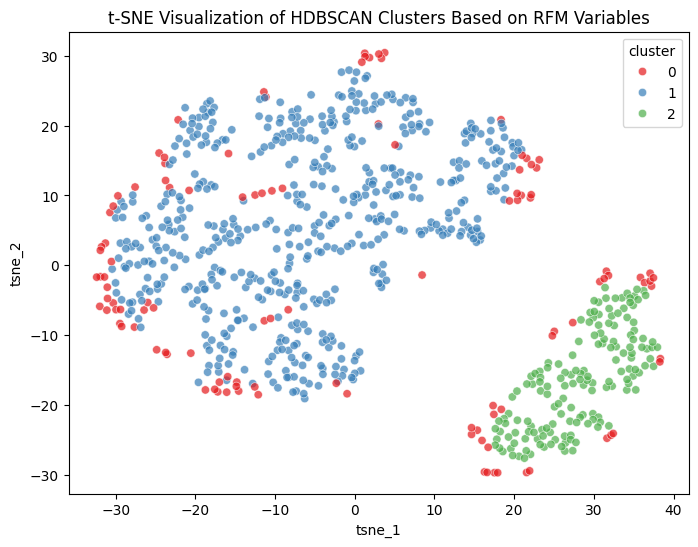

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_dbscan_cluster_df'
rfm_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on RFM Variables')
plt.show()

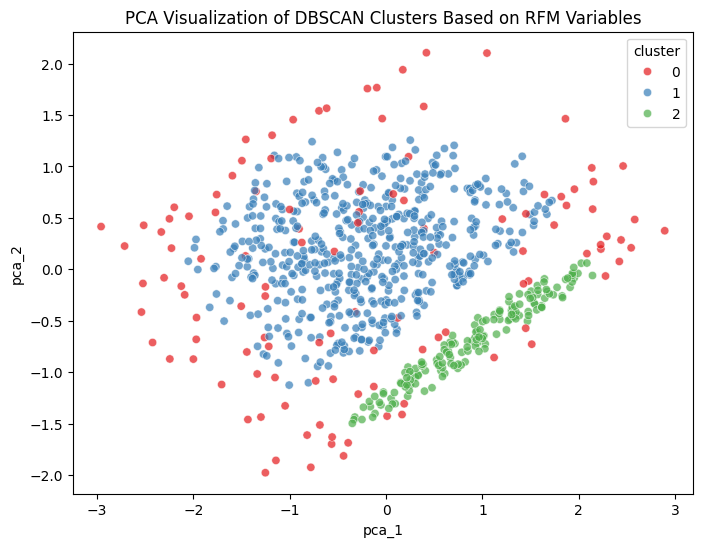

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend and add "(Noise)" for cluster 0
rfm_hdbscan_cluster_df['cluster_str'] = rfm_hdbscan_cluster_df['cluster'].apply(
    lambda x: f'Cluster {x} (Noise)' if x == 0 else f'Cluster {x}'
)

# Define custom colors
custom_colors = {
    'Cluster 0 (Noise)': 'darkblue',  # Cluster O is Noise
    'Cluster 1': 'palevioletred',
    'Cluster 2': 'orange',
}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 0 (Noise)', 'Cluster 1', 'Cluster 2']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_hdbscan_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of HDBSCAN Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

## Model 7: Gaussian Mixture Model

## Model 8: Self Organizing Maps

# Demographic

## Model 9: K-Means

In [16]:
# Display first 5 rows of the dataset
household_profile_df[['age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded']].head()

,age_encoded,income_encoded,household_size_encoded,kid_category_encoded
0,2.0,-0.333333,0.0,0.0
1,0.0,0.000000,0.0,0.0
2,-2.0,-0.666667,0.5,1.0
3,-2.0,0.333333,1.0,2.0
4,0.0,0.000000,-0.5,0.0


In [17]:
# Extract 'age_encoded', 'income_encoded', 'household_size_encoded' and 'kid_category_encoded' variables from house_profile dataset
# and converts them into NumPy array.
demographic_array = household_profile_df[['age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded']].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [18]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
demographic_pca = pca.fit_transform(demographic_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_kmeans_results' for comparison across different k.
demographic_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(demographic_pca)

    demographic_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert results to DataFrame
demographic_kmeans_results_df = pd.DataFrame(demographic_kmeans_results)
demographic_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,1811.495902,0.324635,1.243834,415.346913
1,3,1144.419109,0.397485,0.935331,560.889286
2,4,904.142043,0.382402,0.897232,543.305820
3,5,757.360813,0.392071,0.943374,524.408481
4,6,674.163170,0.393011,0.967981,490.329974
5,7,603.878435,0.343668,1.098422,470.994111
6,8,544.118664,0.368902,0.938227,459.925758
7,9,495.740465,0.368292,0.979483,450.811949
8,10,455.064105,0.385681,0.964683,443.845494


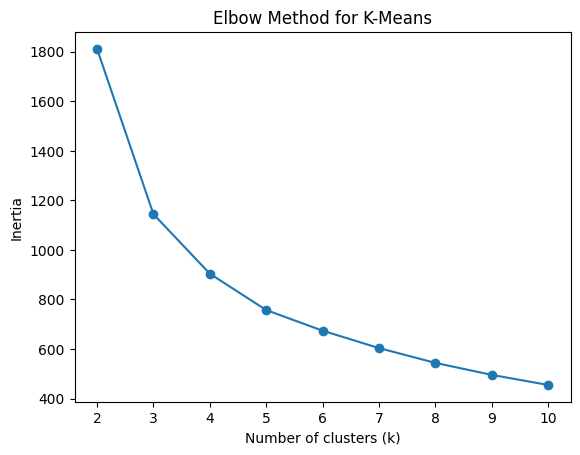

In [19]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(demographic_kmeans_results_df['k'], demographic_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [20]:
# Highest Silhouette Score
best_silhouette_idx = demographic_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.397485 at k = 3.0
Best Davies-Bouldin Index: 0.897232 at k = 4.0
Best Calinski-Harabasz Index: 560.889286 at k = 3.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4.

- Based on Silhouette score, the highest value (0.397) is at k=3, which provides the best clustering. Then, the second highest value (0.393) is at k=6.

- Based on Davies-Bouldin Index (DBI), the lowest value (0.897) is at k = 4, which provides the strongest clustering. Then, it is followed by k=3 (0.935).

- Based on Calinski-Harabasz Index (CHI), the highest value (560.889) is at k=3, which provides the strongest clustering. Then, the second highest value (543.305) is at k=4.
<br>

- The best k is 5 because:
1.   it provides clearer and more interpretable clusters compared to k=3 or 4
2.   based on the elbow method, the inertia curve shows a noticeable flattening, and increasing k beyond value 5 gives smaller benefits.
2.   it has the third highest Silhouette score of 0.392
3.   it has moderate Davies-Bouldin Index (DBI) of 0.943
4.   it has the third highest Calinski-Harabasz Index (CHI) of 524.408




In [21]:
# Create a copy of the dataset to add K-Means cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_kmeans_cluster_df = household_profile_df.copy()

In [56]:
# Fit final K-Means model using k=5
final_k = 5
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(demographic_pca)

# Add cluster labels to the demographic_kmeans_cluster_df
demographic_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=5
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_kmeans_cluster_df.head(5)

Silhouette Score for k=5: 0.392071
Davies-Bouldin Index for k=5: 0.943374
Calinski-Harabasz Index for k=5: 524.408481


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,3,56.987949,63.316593,2.508189,0.564070
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1,58.591007,-38.722618,0.689319,-0.237055
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,5,-60.098301,35.826607,-1.581204,-0.163304
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.

In [57]:
# Columns of interest for clustering based on demographic variables
demographic_cols_of_interest = ['inverse_age_encoded', 'inverse_income_encoded',
                                'inverse_household_size_encoded', 'inverse_kid_category_encoded']

# Initialize an empty list to store cluster summaries
demographic_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_kmeans_cluster_summary = pd.DataFrame(demographic_kmeans_cluster_summary)

# Display the summary
demographic_kmeans_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,326,45-54,50-74K,2,0
1,2,82,45-54,150-174K,2,0
2,3,118,65+,35-49K,2,0
3,4,128,35-44,50-74K,5+,3+
4,5,147,25-34,35-49K,2,0


In [36]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_kmeans_cluster_proportion = demographic_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_kmeans_cluster_proportion)

cluster
1    0.406991
2    0.102372
3    0.147316
4    0.159800
5    0.183521
Name: proportion, dtype: float64


The cluster balance is not very balanced. However, it is still acceptable because threre is no extreme imbalance. Cluster 5 at only 8.7% make sense because high income earners are naturally rare in the population.

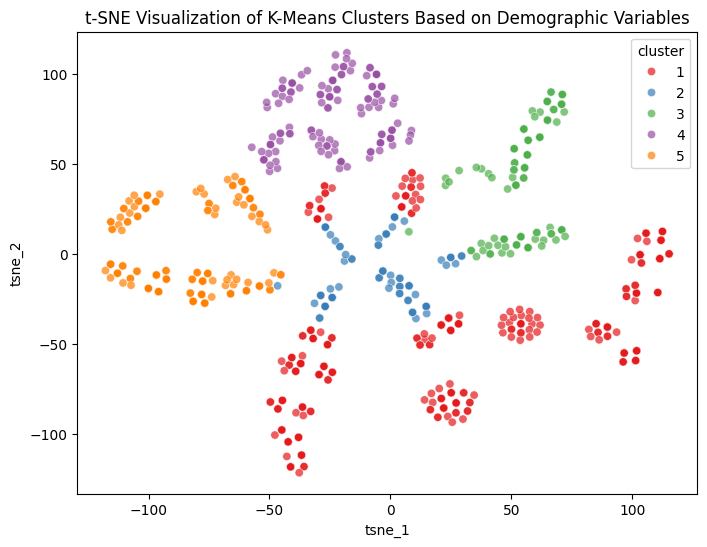

In [39]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_kmeans_cluster_df'
demographic_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on Demographic Variables')
plt.show()

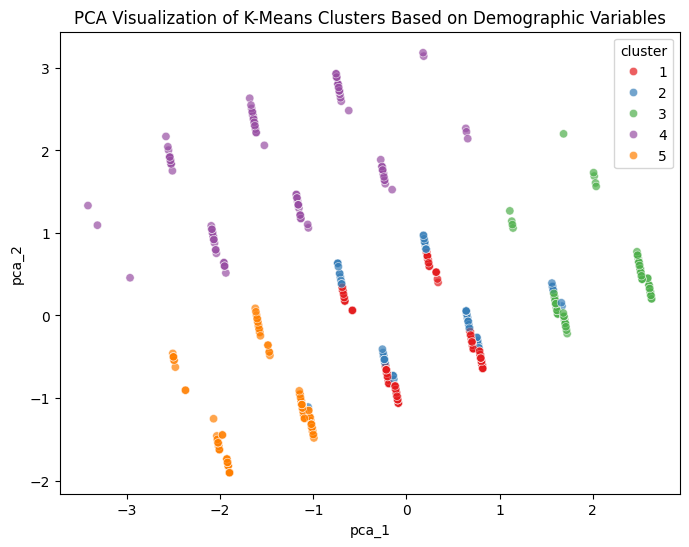

In [38]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
demographic_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on Demographic Variables')
plt.show()

## Model 10: Hierarchical Clustering (Ward Linkage)

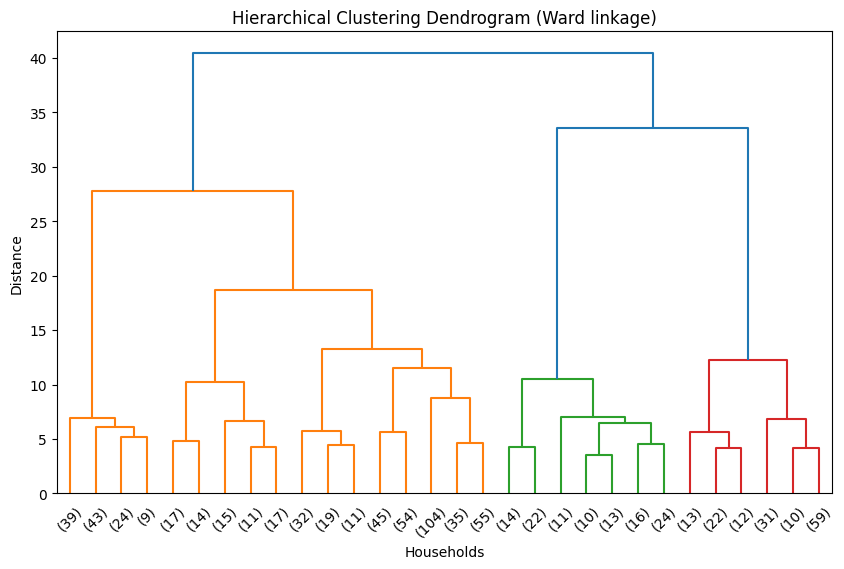

In [40]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Perform hierarchical clustering using Ward linkage.
demographic_hierarchical_ward = linkage(demographic_pca, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a visual separation at k=4

In [41]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_ward_results' for comparison across different k.
demographic_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(demographic_pca)

    demographic_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_ward_results_df = pd.DataFrame(demographic_hierarchical_ward_results)
demographic_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.343501,1.376494,336.424923
1,3,0.363308,0.882771,400.638664
2,4,0.353440,0.924091,474.109271
3,5,0.385110,0.967368,473.756538
4,6,0.368736,0.988811,443.944214
5,7,0.370346,1.004754,427.350555
6,8,0.358644,0.953563,419.819353
7,9,0.363477,0.986247,415.576242
8,10,0.377107,0.988872,418.633630


In [42]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.385110 at k = 5.0
Best Davies-Bouldin Index: 0.882771 at k = 3.0
Best Calinski-Harabasz Index: 474.109271 at k = 4.0


k=4 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=4
- Moderate Silhouette score of 0.353
- Davies-Bouldin Index is the second lowest at k=4 (0.924)
- Calinski-Harabasz index is the highest at k=4 (474.109)

In [43]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_ward_cluster_df = household_profile_df.copy()

In [58]:
# Fit final hierarchical ward clustering model using k=4
final_k = 4
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=4: 0.353440
Davies-Bouldin Index for k=4: 0.924091
Calinski-Harabasz Index for k=4: 474.109271


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,4
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [59]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_ward_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_ward_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_ward_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_ward_cluster_summary = pd.DataFrame(demographic_hierarchical_ward_cluster_summary)

# Display the summary
demographic_hierarchical_ward_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,429,45-54,50-74K,2,0
1,2,147,25-34,35-49K,2,0
2,3,110,35-44,50-74K,5+,3+
3,4,115,65+,35-49K,2,0


In [60]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_ward_cluster_proportion = demographic_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_ward_cluster_proportion)

cluster
1    0.535581
2    0.183521
3    0.137328
4    0.143571
Name: proportion, dtype: float64


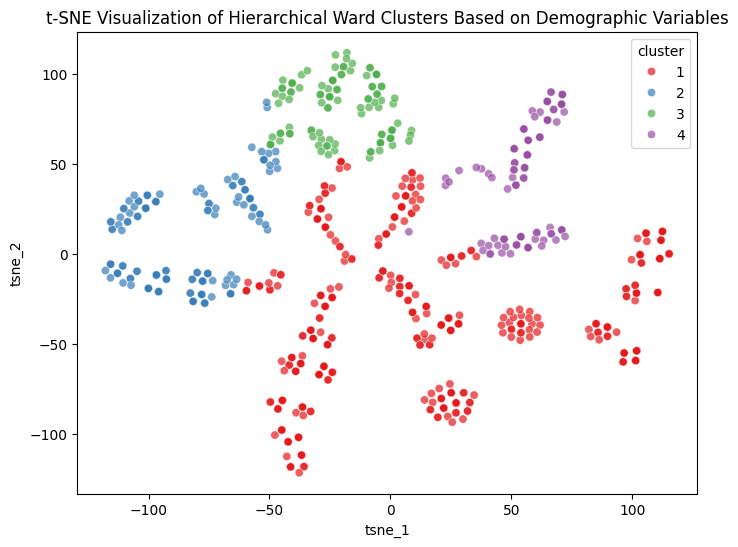

In [61]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on Demographic Variables')
plt.show()

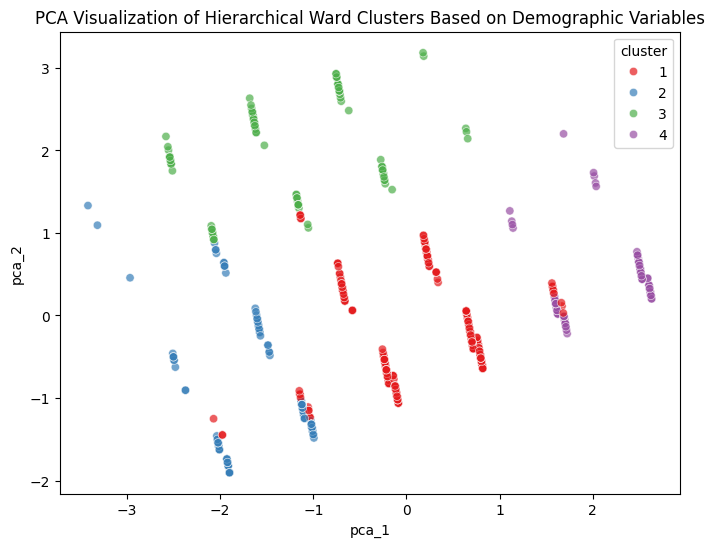

In [62]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on Demographic Variables')
plt.show()

## Model 11: Hierarchical Clustering (Average Linkage)

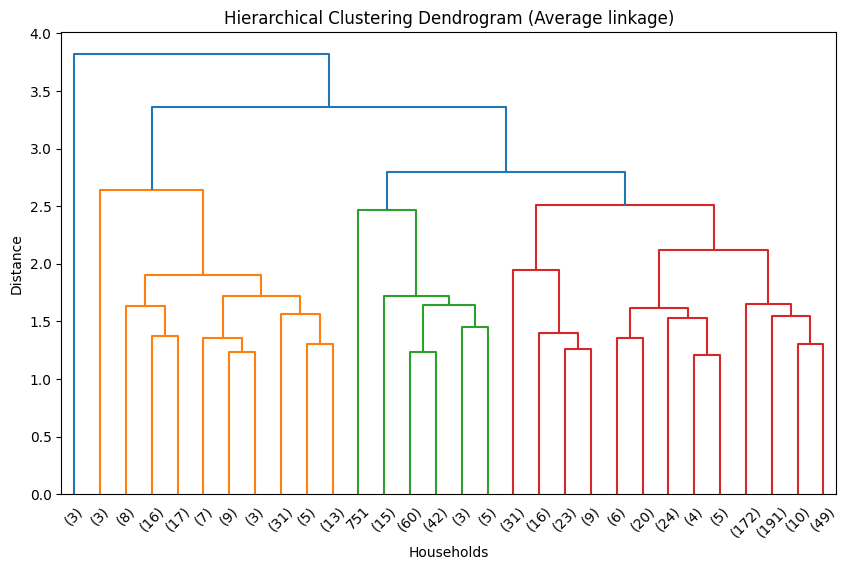

In [63]:
# Perform hierarchical clustering using Average linkage.
demographic_hierarchical_average = linkage(demographic_pca, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=3

In [64]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_average_results' for comparison across different k.
demographic_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(demographic_pca)

    demographic_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_average_results_df = pd.DataFrame(demographic_hierarchical_average_results)
demographic_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.356159,0.533856,10.647965
1,3,0.347573,0.781623,159.902894
2,4,0.320191,0.768178,285.741130
3,5,0.294264,0.744259,219.465510
4,6,0.301440,0.808652,269.144135
5,7,0.285564,0.744434,225.894073
6,8,0.303578,0.790316,247.095873
7,9,0.288875,0.786192,238.466235
8,10,0.283458,0.877049,231.928603


In [65]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.356159 at k = 2.0
Best Davies-Bouldin Index: 0.533856 at k = 2.0
Best Calinski-Harabasz Index: 285.741130 at k = 4.0


k=4 was selected for hierarchical average clustering based on its balanced performance:
- moderate Silhouette score of 0.320.
- moderate Davies-Bouldin index of 0.768.
- moderate Calinski-Harabasz index of 285.741.

In [66]:
# Create a copy of the dataset to add hierarchical average cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_average_cluster_df = household_profile_df.copy()

In [67]:
# Fit final hierarchical average clustering model using k=4
final_k = 4
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=4: 0.320191
Davies-Bouldin Index for k=4: 0.768178
Calinski-Harabasz Index for k=4: 285.741130


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,3
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,3
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [68]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_average_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_average_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_average_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_average_cluster_summary = pd.DataFrame(demographic_hierarchical_average_cluster_summary)

# Display the summary
demographic_hierarchical_average_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,112,35-44,50-74K,5+,3+
1,2,126,65+,35-49K,2,0
2,3,560,45-54,50-74K,2,0
3,4,3,19-24,250K+,1,0


In [69]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_average_cluster_proportion = demographic_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_average_cluster_proportion)

cluster
1    0.139825
2    0.157303
3    0.699126
4    0.003745
Name: proportion, dtype: float64


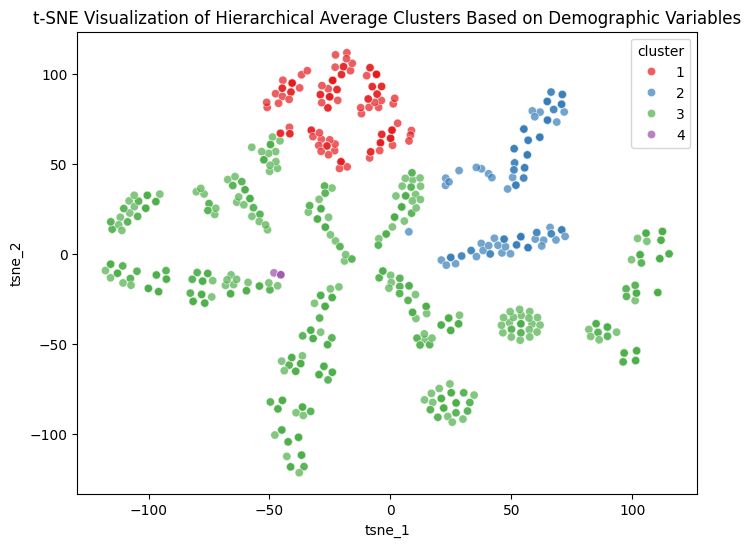

In [70]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on Demographic Variables')
plt.show()

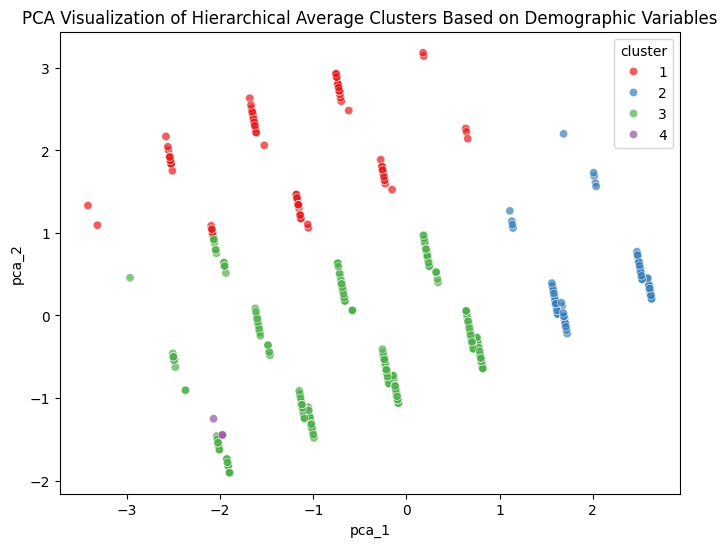

In [71]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on Demographic Variables')
plt.show()

## Model 12: Hierarchical Clustering (Complete Linkage)

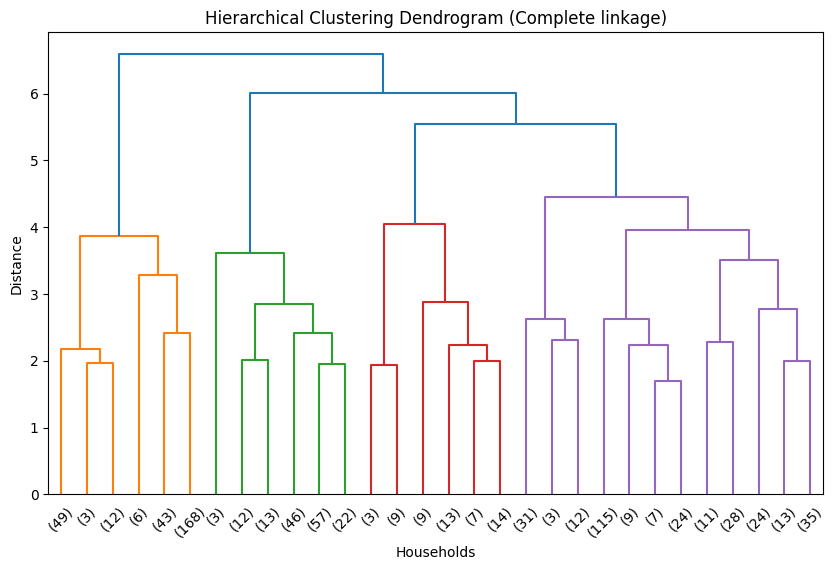

In [72]:
# Perform hierarchical clustering using Complete linkage.
demographic_hierarchical_complete = linkage(demographic_pca, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=4

In [73]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_complete_results' for comparison across different k.
demographic_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(demographic_pca)

    demographic_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_complete_results_df = pd.DataFrame(demographic_hierarchical_complete_results)
demographic_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.262091,1.245486,338.402114
1,3,0.201360,1.410015,275.196482
2,4,0.213837,1.264233,285.975378
3,5,0.240592,1.331112,308.211409
4,6,0.239623,1.172166,258.900511
5,7,0.279109,1.114569,289.557425
6,8,0.247009,1.170208,282.785170
7,9,0.245372,1.081448,257.130163
8,10,0.259899,1.020782,260.320402


In [74]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.279109 at k = 7.0
Best Davies-Bouldin Index: 1.020782 at k = 10.0
Best Calinski-Harabasz Index: 338.402114 at k = 2.0


k=2 was selected for hierarchical complete clustering based on the following:
- Silhouette score is the second highest at k=2 (0.262)
- Moderate Davies-Bouldin Index of 1.245
- Calinski-Harabasz index is the highest at k=2 (338.402)

In [75]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_complete_cluster_df = household_profile_df.copy()

In [76]:
# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.262091
Davies-Bouldin Index for k=2: 1.245486
Calinski-Harabasz Index for k=2: 338.402114


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [77]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_complete_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_complete_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_complete_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_complete_cluster_summary = pd.DataFrame(demographic_hierarchical_complete_cluster_summary)

# Display the summary
demographic_hierarchical_complete_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,520,35-44,50-74K,2,0
1,2,281,45-54,50-74K,2,0


In [78]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_complete_cluster_proportion = demographic_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_complete_cluster_proportion)

cluster
1    0.649189
2    0.350811
Name: proportion, dtype: float64


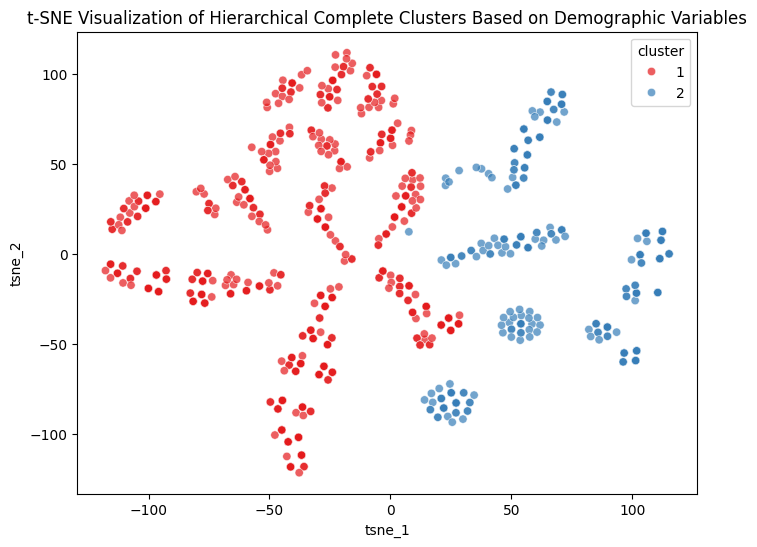

In [79]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on Demographic Variables')
plt.show()

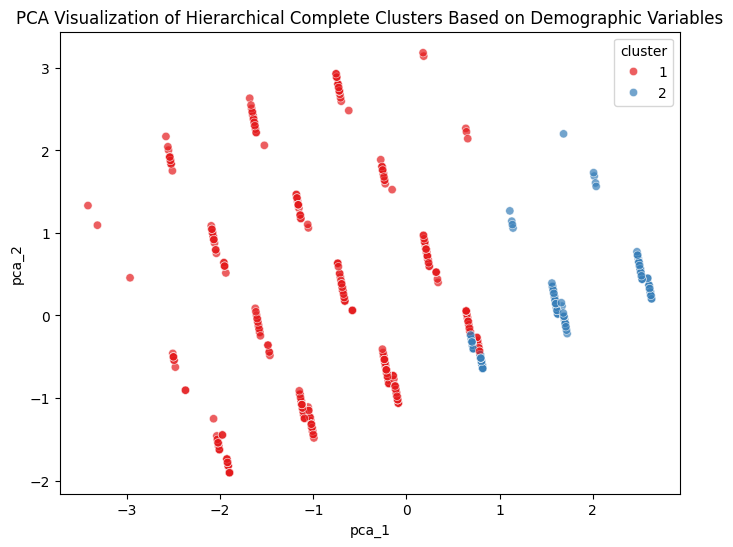

In [80]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on Demographic Variables')
plt.show()

## Model 13: DBSCAN

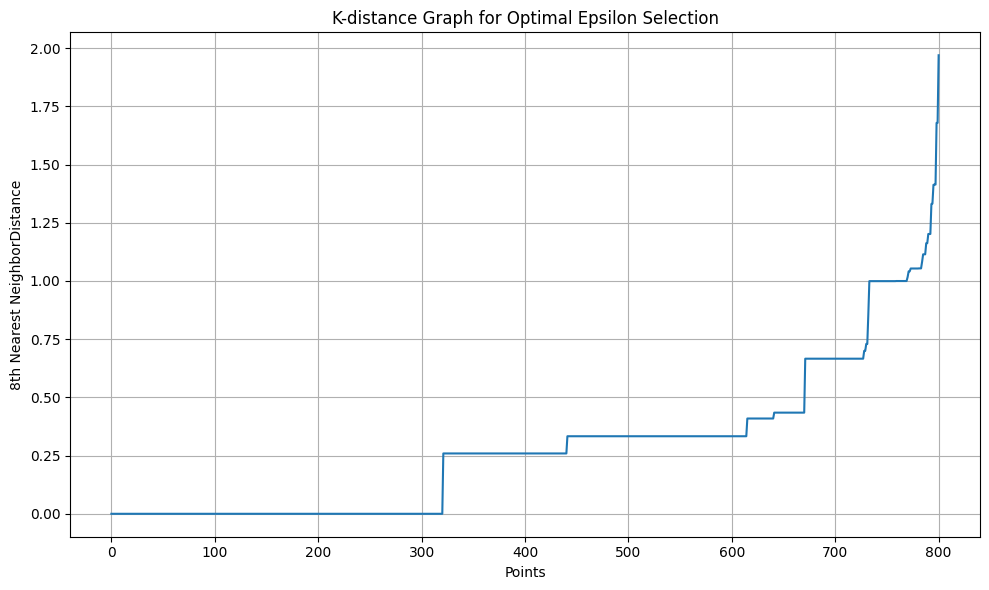

In [106]:
# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 4 variables ('age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded'), so n_neighbors / min_samples = 8.

# Calculate distances to the 8 nearest neighbors for each point.
# The distance to the 8th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 8
demographic_neighbors = NearestNeighbors(n_neighbors=k).fit(demographic_pca)
distances, indices = demographic_neighbors.kneighbors(demographic_pca)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 1.0.

In [107]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Add very small random noise to break duplicate ties for DBCV score
np.random.seed(42)
jitter_amount = 0.001  # Add very small noise, so it will not affect clustering
demographic_pca_jittered = demographic_pca + np.random.normal(0, jitter_amount, demographic_pca.shape)

# Define parameter ranges for DBSCAN
eps_range = [0.6, 0.7, 0.8, 0.9, 0.95, 0.98, 1.0]
min_samples_range = [7, 8, 9]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_dbscan_results'
# for comparison across different eps range and minimum samples range.
demographic_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering on 'demographic_pca_jittered'
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(demographic_pca_jittered)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = demographic_pca_jittered[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(demographic_pca_jittered, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        demographic_dbscan_results.append(result)

# Convert to DataFrame
demographic_dbscan_results_df = pd.DataFrame(demographic_dbscan_results)
demographic_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,0.60,7,16,65,0.081149,0.680319,0.438248,0.907030,284.408496
1,0.60,8,15,81,0.101124,0.669506,0.444740,0.900118,291.670956
2,0.60,9,15,88,0.109863,0.663207,0.447396,0.880146,290.534183
3,0.70,7,16,27,0.033708,0.683041,0.410450,1.115703,273.886510
4,0.70,8,15,37,0.046192,0.672955,0.412213,1.101000,287.724821
5,0.70,9,15,39,0.048689,0.679899,0.413747,1.093154,288.450070
6,0.80,7,16,27,0.033708,0.683041,0.410450,1.115703,273.886510
7,0.80,8,15,37,0.046192,0.672955,0.412213,1.101000,287.724821
8,0.80,9,15,39,0.048689,0.679899,0.413747,1.093154,288.450070
9,0.90,7,8,27,0.033708,0.371323,0.143385,1.534777,138.670442


In [108]:
# Highest DBCV Score
best_dbcv_idx = demographic_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = demographic_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = demographic_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.683041 at eps = 0.7, min_samples = 7.0
Best Silhouette Score: 0.447396 at eps = 0.6, min_samples = 9.0
Best Davies-Bouldin Index: 0.880146 at eps = 0.6, min_samples = 9.0
Best Calinski-Harabasz Index: 291.670956 at eps = 0.6, min_samples = 8.0


We tested with different epsilon values (0.6, 0.7, 0.8, 0.9, 0.95, 0.98 & 1.0) and minimum samples values (7, 8 & 9).

eps=0.7 and min_sample = 7 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio equal to 0.034
- DBCV score is the highest at 0.683
- Moderate Silhouette score of 0.410
- Moderate Davies-Bouldin index of 1.116
- Moderate Calinski-Harabasz index of 273.887

In [109]:
# Create a copy of the dataset to add DBSCAN cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_dbscan_cluster_df = household_profile_df.copy()

In [110]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 0.7
best_min_samples = 7
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(demographic_pca_jittered)

# Add cluster labels to the 'demographic_dbscan_cluster_df'
demographic_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.4 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = demographic_pca_jittered[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(demographic_pca_jittered, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_dbscan_cluster_df.head(5)

Number of clusters for eps=0.7 & min_samples=7: 16
Number of noise for eps=0.7 & min_samples=7: 27
Noise ratio for eps=0.7 & min_samples=7: 0.033708
DBCV Score for eps=0.7 & min_samples=7: 0.683041
Silhouette Score for eps=0.7 & min_samples=7: 0.410450
Davies-Bouldin Index for eps=0.7 & min_samples=7: 1.115703
Calinski-Harabasz Index for eps=0.7 & min_samples=7: 273.886510


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,3
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [111]:
# Initialize an empty list to store cluster summaries
demographic_dbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_dbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_dbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_dbscan_cluster_summary = pd.DataFrame(demographic_dbscan_cluster_summary)

# Display the summary
demographic_dbscan_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,27,55-64,250K+,3,1
1,1,67,65+,35-49K,2,0
2,2,211,45-54,50-74K,2,0
3,3,25,25-34,35-49K,3,1
4,4,20,25-34,25-34K,4,2
5,5,116,35-44,50-74K,2,0
6,6,80,25-34,50-74K,1,0
7,7,27,35-44,35-49K,5+,3+
8,8,21,45-54,125-149K,5+,3+
9,9,31,19-24,35-49K,1,0


Note: Cluser 0 is noise.

In [112]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_dbscan_cluster_proportion = demographic_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_dbscan_cluster_proportion)

cluster
0     0.033708
1     0.083645
2     0.263421
3     0.031211
4     0.024969
5     0.144819
6     0.099875
7     0.033708
8     0.026217
9     0.038702
10    0.062422
11    0.036205
12    0.048689
13    0.019975
14    0.021223
15    0.022472
16    0.008739
Name: proportion, dtype: float64


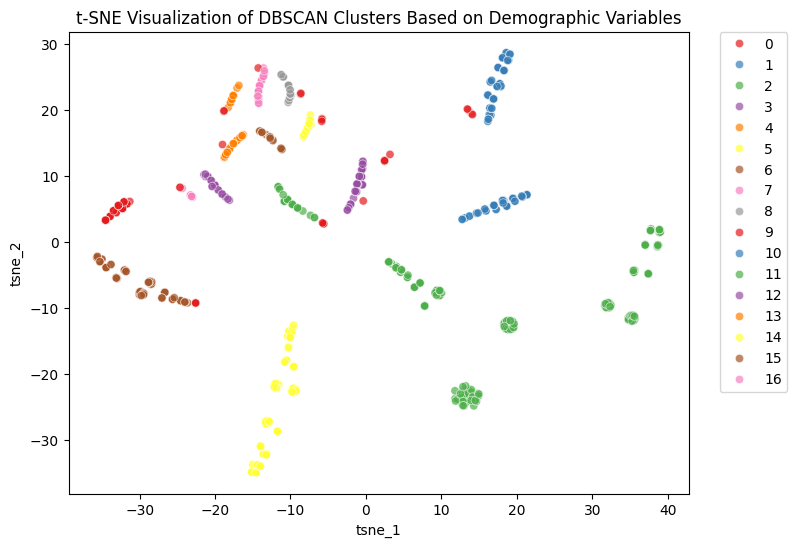

In [113]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca_jittered)

# Add t-SNE results to 'demographic_dbscan_cluster_df'
demographic_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

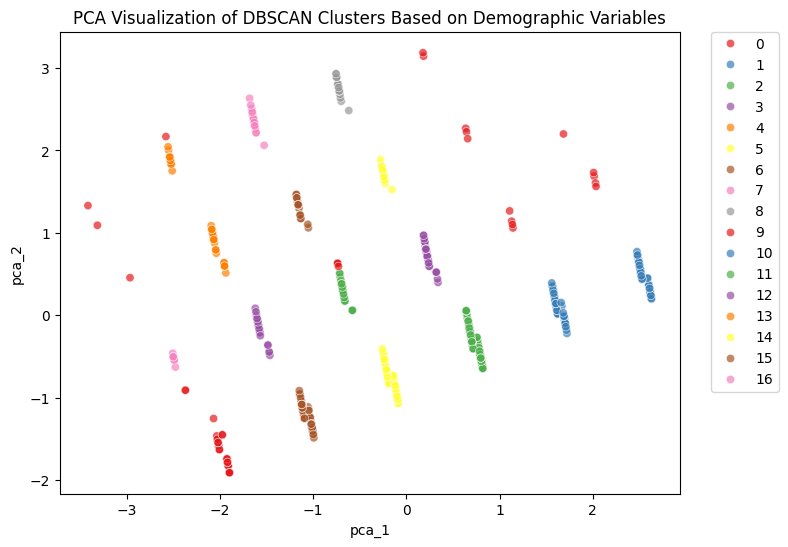

In [114]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca_jittered)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
demographic_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

## Model 14: HDBSCAN

In [115]:
# For HDBSCAN, min_cluster_size is the minimum number of points requried to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Add very small random noise to break duplicate ties for DBCV score
np.random.seed(42)
jitter_amount = 0.001  # Add very small noise, so it will not affect clustering
demographic_pca_jittered = demographic_pca + np.random.normal(0, jitter_amount, demographic_pca.shape)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 20, 30, 50, 75, 100]
min_samples_range = [1, 5, 10, 15, 20]

# Store results
demographic_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        demographic_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = demographic_hdbscan.fit_predict(demographic_pca_jittered)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = demographic_pca_jittered[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(demographic_pca_jittered, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        demographic_hdbscan_results.append(result)

# Convert to DataFrame
demographic_hdbscan_results_df = pd.DataFrame(demographic_hdbscan_results)
demographic_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,73,68,0.084894,0.649697,0.765436,0.500211,458.464193
1,5,5,56,136,0.169788,0.632480,0.773483,0.473542,472.511521
2,5,10,29,212,0.264669,0.558539,0.656856,0.632137,455.583414
3,5,15,18,210,0.262172,0.593341,0.562371,0.700855,357.247541
4,5,20,14,288,0.359551,0.515657,0.571053,0.624134,472.043150
5,10,1,36,76,0.094881,0.535911,0.552863,0.814677,224.886437
6,10,5,32,148,0.184769,0.552111,0.606573,0.719309,293.959557
7,10,10,29,212,0.264669,0.558539,0.656856,0.632137,455.583414
8,10,15,17,215,0.268414,0.592266,0.566612,0.695300,363.361141
9,10,20,12,284,0.354557,0.456795,0.528726,0.709108,411.376793


In [124]:
# Highest DBCV Score
best_dbcv_idx = demographic_hdbscan_results_df['dbcv_score'].idxmax()
best_dbcv = demographic_hdbscan_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = demographic_hdbscan_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hdbscan_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hdbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hdbscan_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hdbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hdbscan_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.649697 at min_cluster_size = 5.0, min_samples = 1.0
Best Silhouette Score: 0.773483 at min_cluster_size = 5.0, min_samples = 5.0
Best Davies-Bouldin Index: 0.473542 at min_cluster_size = 5.0, min_samples = 5.0
Best Calinski-Harabasz Index: 472.511521 at min_cluster_size = 5.0, min_samples = 5.0


min_cluster_size = 5.0, min_samples = 15.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 14
- Moderate noise ratio equal to 0.262 (Not too aggressive)
- Moderate DBCV score of 0.593
- Moderate Silhouette score of 0.562, Davies-Bouldin index of 0.701, and Calinski-Harabasz index of 357.248

In [117]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hdbscan_cluster_df = household_profile_df.copy()

In [125]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 15
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(demographic_pca_jittered)

# Add cluster labels to the dataframe
demographic_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = demographic_pca_jittered[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(demographic_pca_jittered, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=15: 18
Number of noise for min_cluster_size=5 & min_samples=15: 210
Noise ratio for min_cluster_size=5 & min_samples=15: 0.262172
DBCV Score for min_cluster_size=5 & min_samples=15: 0.593341
Silhouette Score for min_cluster_size=5 & min_samples=15: 0.562371
Davies-Bouldin Index for min_cluster_size=5 & min_samples=15: 0.700855
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=15: 357.247541


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,3,17.427105,23.580759,2.508543,0.564166
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,18,18.337952,-12.903193,0.690791,-0.237179
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,8,-20.516645,9.339829,-1.579702,-0.162770
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.

In [119]:
# Initialize an empty list to store cluster summaries
demographic_hdbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hdbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hdbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hdbscan_cluster_summary = pd.DataFrame(demographic_hdbscan_cluster_summary)

# Display the summary
demographic_hdbscan_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,77,19-24,35-49K,5+,0
1,1,250,45-54,50-74K,2,0
2,2,67,65+,35-49K,2,0
3,3,50,55-64,35-49K,2,0
4,4,80,25-34,50-74K,1,0
5,5,277,35-44,35-49K,2,0


Note: Cluser 0 is noise.

In [120]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hdbscan_cluster_proportion = demographic_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hdbscan_cluster_proportion)

cluster
0    0.096130
1    0.312110
2    0.083645
3    0.062422
4    0.099875
5    0.345818
Name: proportion, dtype: float64


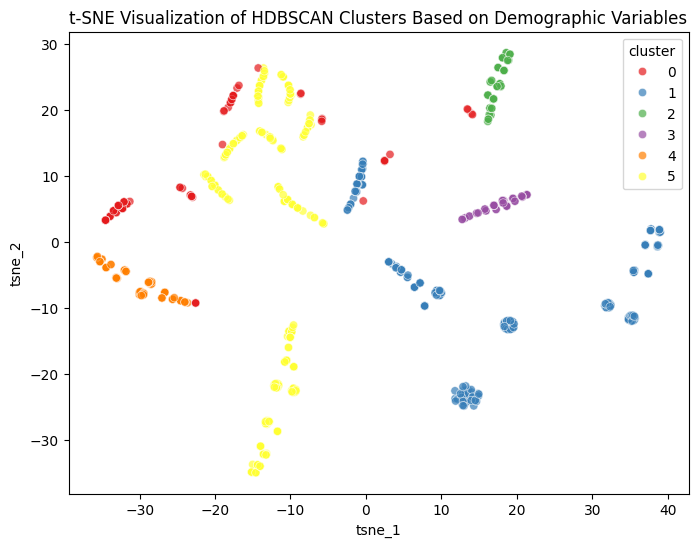

In [121]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca_jittered)

# Add t-SNE results to 'demographic_dbscan_cluster_df'
demographic_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on Demographic Variables')
plt.show()

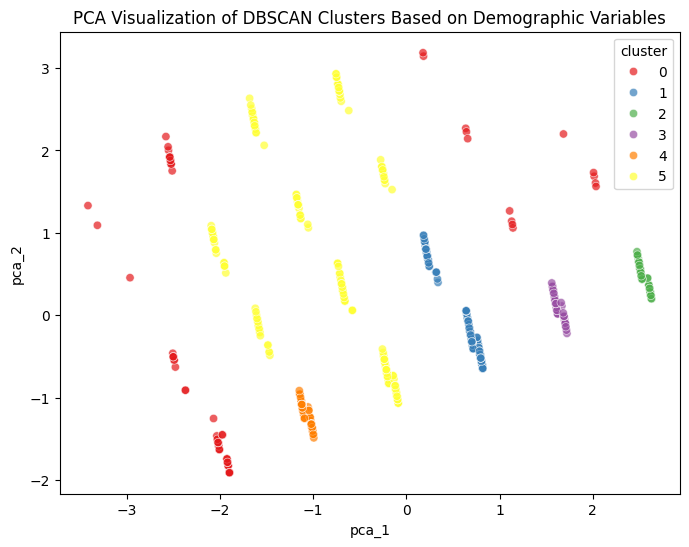

In [122]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca_jittered)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Demographic Variables')
plt.show()

## Model 15: Gaussian Mixture Model

## Model 16: Self Organizing Maps

# Behavioural

# Product Preference

## Model 25: K-Means

### Main: Use k = 2

In [62]:
# Display first 5 rows of the dataset
household_profile_df[
    [
        'national_proportion',
        'private_proportion',
        'alcohol_proportion',
        'deli & bakery_proportion',
        'entertainment & leisure_proportion',
        'general_grocery_proportion',
        'health_personal_care_proportion',
        'home & lifestyle_proportion',
        'meat_proportion',
        'miscellaneous & services_proportion',
        'produce_proportion',
        'seafood_proportion'
    ]
].head()

,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881
1,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107
2,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544
3,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511
4,0.492382,-0.492382,0.152564,2.071352,0.166213,1.415026,1.086591,-0.864491,1.165722,1.238202,1.401472,-3.320718


In [63]:
# Extract'national_proportion', 'alcohol_proportion', 'deli & bakery_proportion', 'entertainment & leisure_proportion',
# 'general_grocery_proportion', 'health_personal_care_proportion', 'home & lifestyle_proportion', 'meat_proportion', 'miscellaneous & services_proportion',
# 'produce_proportion' and'seafood_proportion' variables from house_profile dataset.
# and converts them into NumPy array.

# Not extracting 'private_proportion' for clustering algorithm because it is perfectly correlated with 'national_proportion'.
# It will add zero new information, and it only adds noise and redudancy during clustering.
product_array = household_profile_df[
    [
        'national_proportion',
        'alcohol_proportion',
        'deli & bakery_proportion',
        'entertainment & leisure_proportion',
        'general_grocery_proportion',
        'health_personal_care_proportion',
        'home & lifestyle_proportion',
        'meat_proportion',
        'miscellaneous & services_proportion',
        'produce_proportion',
        'seafood_proportion'
    ]
].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [64]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_kmeans_results' for comparison across different k.
product_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(product_pca)

    product_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert results to DataFrame
product_kmeans_results_df = pd.DataFrame(product_kmeans_results)
product_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,3784.065150,0.464237,0.998939,380.019775
1,3,2950.503587,0.278440,1.292342,356.109030
2,4,2586.143948,0.294070,1.115991,307.944090
3,5,2379.575893,0.235659,1.299917,267.967259
4,6,2200.372301,0.239246,1.361926,244.491017
5,7,2038.188704,0.224593,1.477073,230.208208
6,8,1892.464724,0.225660,1.336317,220.971100
7,9,1754.491329,0.226301,1.330336,216.077132
8,10,1641.704423,0.236773,1.306272,211.042776


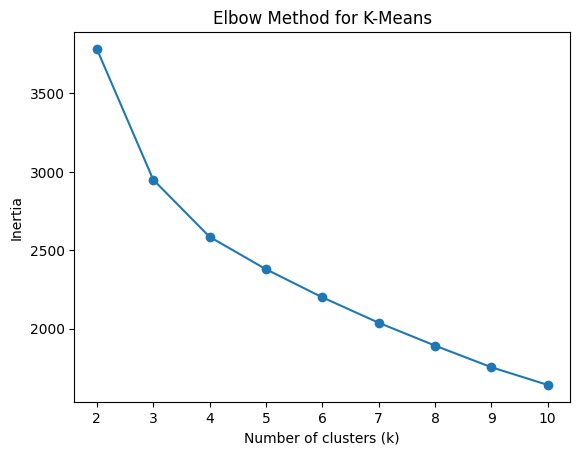

In [65]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(product_kmeans_results_df['k'], product_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [66]:
# Highest Silhouette Score
best_silhouette_idx = product_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = product_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.464237 at k = 2.0
Best Davies-Bouldin Index: 0.998939 at k = 2.0
Best Calinski-Harabasz Index: 380.019775 at k = 2.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=3, then a moderate drop from k=3 to k=5 and very small drops after that. Thus, based on the elbow method, k=3.

- Based on Silhouette score, the highest value (0.464) is at k=2, which provides the best clustering.

- Based on Davies-Bouldin Index (DBI), the lowest value (0.999) is at k=2, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (380.020) is at k=2, which provides the strongest clustering.
<br>

- The best k is 2 because:
1.   it provides clearer and more interpretable clusters compared to k=3
2.   it has the highest Silhouette score of 0.464
3.   it has the lowest Davies-Bouldin Index (DBI) of 0.999
4.   it has the highest Calinski-Harabasz Index (CHI) of 380.020




In [67]:
# Create a copy of the dataset to add K-Means cluster labels based on product preference variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_kmeans_cluster_df = household_profile_df.copy()

In [68]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final K-Means model using k=2
final_k = 2
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(product_pca)

# Add cluster labels to the product_kmeans_cluster_df for us to interpret the clusters using the
# original features.
product_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_kmeans_cluster_df.head(10)

Silhouette Score for k=2: 0.464237
Davies-Bouldin Index for k=2: 0.998939
Calinski-Harabasz Index for k=2: 380.019775


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511

In [69]:
# Define feature names in the same order as they appear in product_array
feature_names = [
    'national_proportion',
    'alcohol_proportion',
    'deli & bakery_proportion',
    'entertainment & leisure_proportion',
    'general_grocery_proportion',
    'health_personal_care_proportion',
    'home & lifestyle_proportion',
    'meat_proportion',
    'miscellaneous & services_proportion',
    'produce_proportion',
    'seafood_proportion'
]

# Create a DataFrame of PCA loadings
loadings = pd.DataFrame(
    pca.components_,
    columns=feature_names,
    index=[f'PC{i+1}' for i in range(pca.n_components_)]
)

# Display the dataframe
loadings

,national_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
PC1,-0.026116,0.048697,-0.310113,0.011557,-0.337079,-0.347488,0.063644,-0.244816,-0.195411,-0.245487,0.709816
PC2,-0.096149,-0.194651,0.250321,-0.168122,0.309179,0.199925,-0.208779,0.411204,0.092256,0.285005,0.651124
PC3,-0.352338,-0.047375,-0.186663,-0.138557,-0.033576,-0.077801,0.027766,-0.112022,0.885350,-0.122182,0.017312
PC4,0.710577,-0.202011,0.080300,-0.026107,-0.052518,0.258413,0.085276,-0.479559,0.268579,0.212739,0.151544
PC5,0.563806,0.055570,-0.266015,0.020509,-0.062804,-0.101579,-0.088474,0.637886,0.195554,-0.374038,-0.026757
PC6,-0.026057,-0.564044,0.019553,0.652300,-0.113679,-0.385806,-0.056448,0.107013,0.080218,0.264147,-0.051787
PC7,0.138190,0.530314,0.334860,-0.023126,-0.175944,-0.451914,-0.477908,-0.049691,0.155801,0.310651,-0.013369


In [70]:
# Show explained variance of each PC
explained_variance = pd.Series(
    pca.explained_variance_ratio_,
    index=loadings.index,
    name="Explained Variance Ratio"
)

explained_variance

,Explained Variance Ratio
PC1,0.346966
PC2,0.211601
PC3,0.122912
PC4,0.092646
PC5,0.054610
PC6,0.049676
PC7,0.038500


In [71]:
# Check top contributing features per PC
for pc in loadings.index:
    print(f"\n{pc} – top contributing variables:")
    print(loadings.loc[pc].abs().sort_values(ascending=False).head(5))


PC1 – top contributing variables:
seafood_proportion                 0.709816
health_personal_care_proportion    0.347488
general_grocery_proportion         0.337079
deli & bakery_proportion           0.310113
produce_proportion                 0.245487
Name: PC1, dtype: float64

PC2 – top contributing variables:
seafood_proportion            0.651124
meat_proportion               0.411204
general_grocery_proportion    0.309179
produce_proportion            0.285005
deli & bakery_proportion      0.250321
Name: PC2, dtype: float64

PC3 – top contributing variables:
miscellaneous & services_proportion    0.885350
national_proportion                    0.352338
deli & bakery_proportion               0.186663
entertainment & leisure_proportion     0.138557
produce_proportion                     0.122182
Name: PC3, dtype: float64

PC4 – top contributing variables:
national_proportion                    0.710577
meat_proportion                        0.479559
miscellaneous & services_propor

In [72]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_kmeans_cluster_summary = pd.DataFrame(product_kmeans_cluster_summary)

# Sort clusters by household count descending
product_kmeans_cluster_summary = product_kmeans_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_kmeans_cluster_summary['cluster'] = range(1, len(product_kmeans_cluster_summary)+1)

# Display the summary
product_kmeans_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,684,0.722357,0.277643,1.000000e-06,0.036323,0.000001,0.636341,0.10944,0.001235,0.072718,0.011534,0.096745,4.429436e-03
1,2,117,0.734635,0.265365,1.000000e-06,0.036088,0.000001,0.655151,0.12629,0.000713,0.061682,0.011969,0.070796,1.000000e-06


In [73]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    684         National             0.722357            0.277643 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.636341      0.10944     0.096745     0.072718     0.036323     0.011534     0.004429     0.001235 1.000000e-06  1.000000e-06
       2    117         National             0.734635            0.265365 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous A

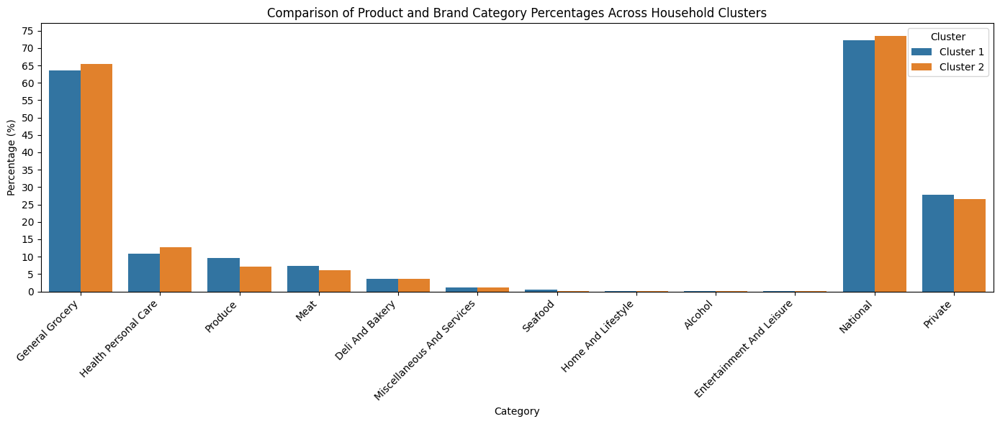

In [74]:
# Convert the cluster insights DataFrame from wide to long format and
# create a row for each cluster-category combination with its corresponding percentage.
product_kmeans_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_kmeans_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_kmeans_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_kmeans_category_cols, product_kmeans_value_cols):
        product_kmeans_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_kmeans_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_kmeans_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_kmeans_plot_df = pd.DataFrame(product_kmeans_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_kmeans_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_kmeans_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

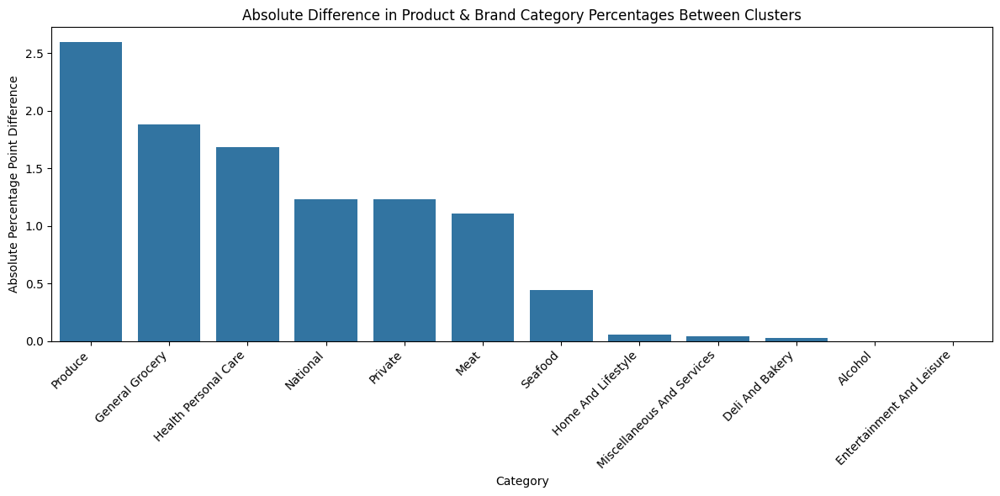

In [75]:
# Create dataframe with absolute differences
# Convert list to DataFrame
product_kmeans_difference_plot_df = pd.DataFrame(product_kmeans_plot_data)

# Pivot to wide format
diff_df = product_kmeans_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference
diff_df['Absolute Difference'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences
diff_df = diff_df.sort_values(
    by='Absolute Difference',
    ascending=False
)

# Plot bar chart (Absolute differences in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Clusters')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are produce, general grocery and health personal care. This indicates that these variables contribute most in distinguishing the two clusters.

In [76]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences  between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:
- Cluster 1 (more focused on fresh food) has slightly higher spending on produce, meat, seafood and private brand compared to cluster 2.
- Cluster 2 (more focused on general grocery and health/personal care) has slightly higher spending on general grocery, health/personal care and national brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. deli & bakery (3.6%)
3. miscellaneous & services (1.2%)
4. home & lifestyle (0.1%)
5. alcohol (0.0%)
6. entertainment & leisure. (0.0%)
- The largest difference comes from seafood, where Cluster 1 spends 0.4% while Cluster 2 spends 0% (never purchased seafood). Although this is a small absolute difference, the fact that Cluster 2 never buys seafood creates a binary difference, this has large effect on separating the clusters, as shown by a variance score of 2.034.

In [77]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_kmeans_cluster_proportion = product_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_kmeans_cluster_proportion)

cluster
1    0.853933
2    0.146067
Name: proportion, dtype: float64


The cluster balance is not very balanced. However, it is still acceptable because there is no extreme imbalance.

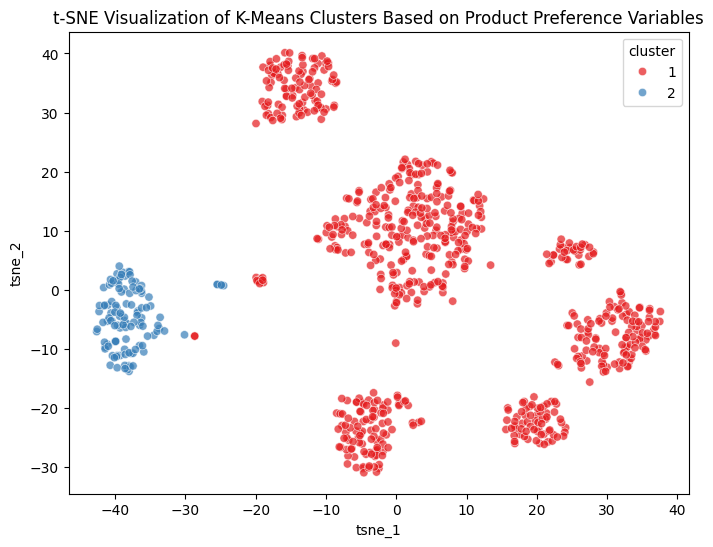

In [78]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'demographic_kmeans_cluster_df'
product_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
product_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on Product Preference Variables')
plt.show()

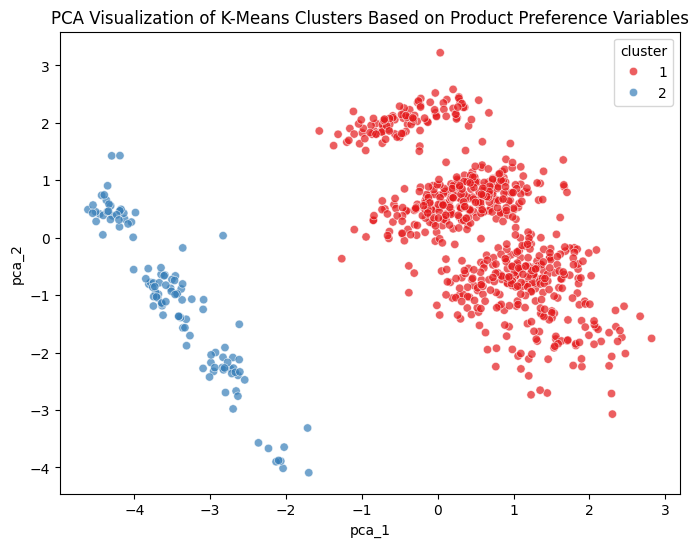

In [79]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_kmeans_cluster_df'
product_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
product_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on Product Preference Variables')
plt.show()

### Testing: Use different k values (k=4)

In [80]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final K-Means model using k=4
final_k = 4
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(product_pca)

# Add cluster labels to the product_kmeans_cluster_df for us to interpret the clusters using the
# original features.
product_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_kmeans_cluster_df.head(10)

Silhouette Score for k=4: 0.294070
Davies-Bouldin Index for k=4: 1.115991
Calinski-Harabasz Index for k=4: 307.944090


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,2,-36.803398,-3.615456,-3.807593,-0.808053
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,1,-2.887683,16.509840,-0.576041,0.576502
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,3,28.881777,-9.930691,1.289474,-1.101559
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.56929

In [81]:
# Columns of interest for clustering based on product variables
product_cols_of_interest_test1 = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest_test1:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_kmeans_cluster_summary = pd.DataFrame(product_kmeans_cluster_summary)

# Display the summary
product_kmeans_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,387,0.716163,0.283837,1.000000e-06,0.034973,1.000000e-06,0.646730,0.102006,0.000710,0.076655,1.132684e-02,0.089420,4.595579e-03
1,2,112,0.740971,0.259029,1.000000e-06,0.034837,1.000000e-06,0.656322,0.127044,0.000718,0.059787,1.255995e-02,0.070668,1.000000e-06
2,3,288,0.730621,0.269379,4.431559e-04,0.037530,3.637026e-04,0.624099,0.118378,0.002019,0.066776,1.299485e-02,0.106641,4.324241e-03
3,4,14,0.719287,0.280713,1.000000e-06,0.053434,1.000000e-06,0.612624,0.118707,0.000001,0.083771,1.000000e-06,0.074091,3.440524e-03


In [82]:
# List of product category columns (excluding brand)
product_category_cols_test1 = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols_test1
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category            top_9_category            top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    387         National             0.716163            0.283837 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle                   Alcohol  Entertainment And Leisure     0.646730     0.102006     0.089420     0.076655     0.034973     0.011327     0.004596 7.102259e-04 1.000000e-06  1.000000e-06
       2    112         National             0.740971            0.259029 General Grocery Health Personal Care        Produce           Meat Deli An

The clustering at k=4 performs worse than k=2 because it has a lower Silhouette Score, a higher Davies-Bouldin Index, and a lower Calinski-Harabasz Index. Additionally, the differences in category proportions between many clusters are very small, making interpretation challenging.

## Model 26: Hierarchical Clustering (Ward Linkage)

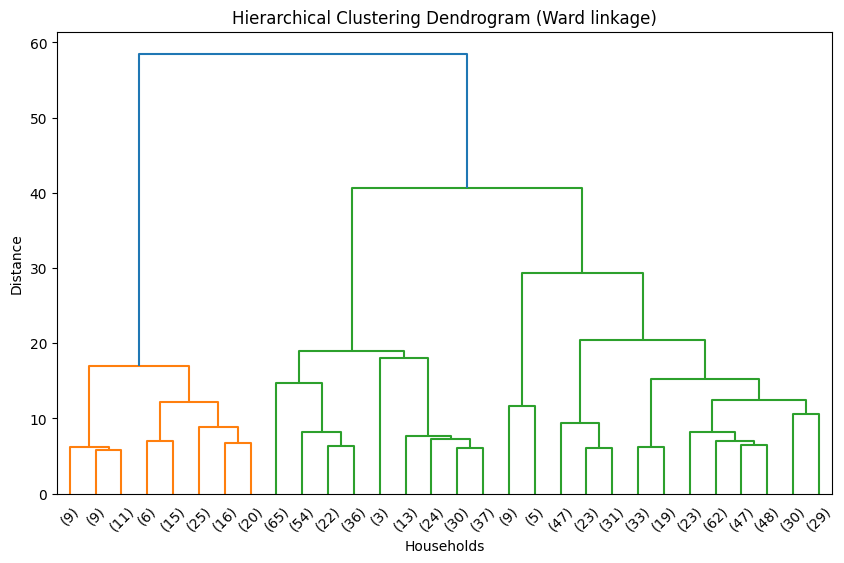

In [83]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Ward linkage.
product_hierarchical_ward = linkage(product_pca, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [84]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_ward_results' for comparison across different k.
product_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(product_pca)

    product_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_ward_results_df = pd.DataFrame(product_hierarchical_ward_results)
product_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.449756,0.961759,353.275561
1,3,0.274033,1.317922,332.579756
2,4,0.292710,1.128149,301.244119
3,5,0.230941,1.311431,262.414768
4,6,0.242352,1.386231,239.589456
5,7,0.238739,1.226653,225.381443
6,8,0.222908,1.292972,215.811238
7,9,0.220549,1.320873,207.140565
8,10,0.229779,1.293343,201.327900


In [85]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.449756 at k = 2.0
Best Davies-Bouldin Index: 0.961759 at k = 2.0
Best Calinski-Harabasz Index: 353.275561 at k = 2.0


k=2 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.450
- it has the lowest Davies-Bouldin Index (DBI) of 0.962
- it has the highest Calinski-Harabasz Index (CHI) of 353.276

In [86]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_ward_cluster_df = household_profile_df.copy()

In [87]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical ward clustering model using k=2
final_k = 2
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=2: 0.449756
Davies-Bouldin Index for k=2: 0.961759
Calinski-Harabasz Index for k=2: 353.275561


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [88]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_ward_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_ward_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_ward_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_ward_cluster_summary = pd.DataFrame(product_hierarchical_ward_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_ward_cluster_summary = product_hierarchical_ward_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_ward_cluster_summary['cluster'] = range(1, len(product_hierarchical_ward_cluster_summary)+1)

# Display the summary
product_hierarchical_ward_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,690,0.722357,0.277643,1.000000e-06,0.036515,0.000001,0.636341,0.109440,0.001235,0.072718,0.011385,0.096973,4.394677e-03
1,2,111,0.742811,0.257189,1.000000e-06,0.034749,0.000001,0.657492,0.127798,0.000713,0.059839,0.012642,0.070539,1.000000e-06


In [89]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_ward_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    690         National             0.722357            0.277643 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.636341     0.109440     0.096973     0.072718     0.036515     0.011385     0.004395     0.001235 1.000000e-06  1.000000e-06
       2    111         National             0.742811            0.257189 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous A

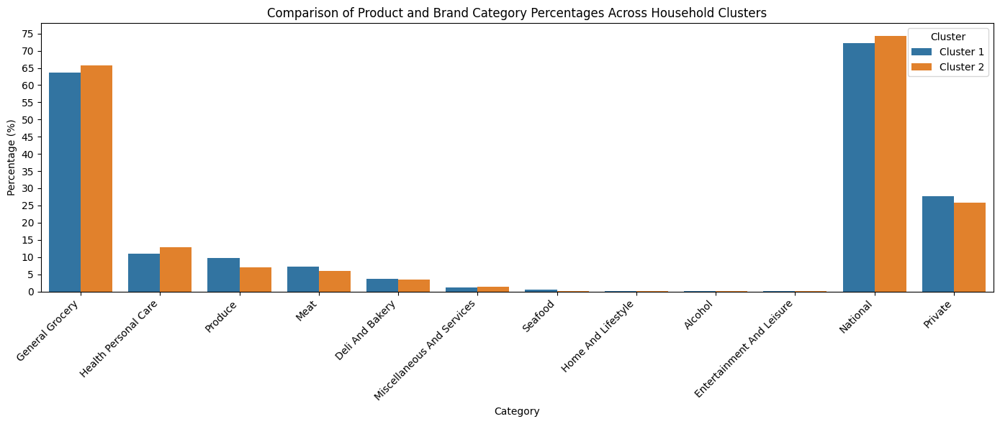

In [90]:
# Convert the cluster insights DataFrame from wide to long format and
# create a row for each cluster-category combination with its corresponding percentage.
product_hierarchical_ward_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_hierarchical_ward_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_hierarchical_ward_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_hierarchical_ward_category_cols, product_hierarchical_ward_value_cols):
        product_hierarchical_ward_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_hierarchical_ward_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_hierarchical_ward_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_hierarchical_ward_plot_df = pd.DataFrame(product_hierarchical_ward_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_hierarchical_ward_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_hierarchical_ward_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

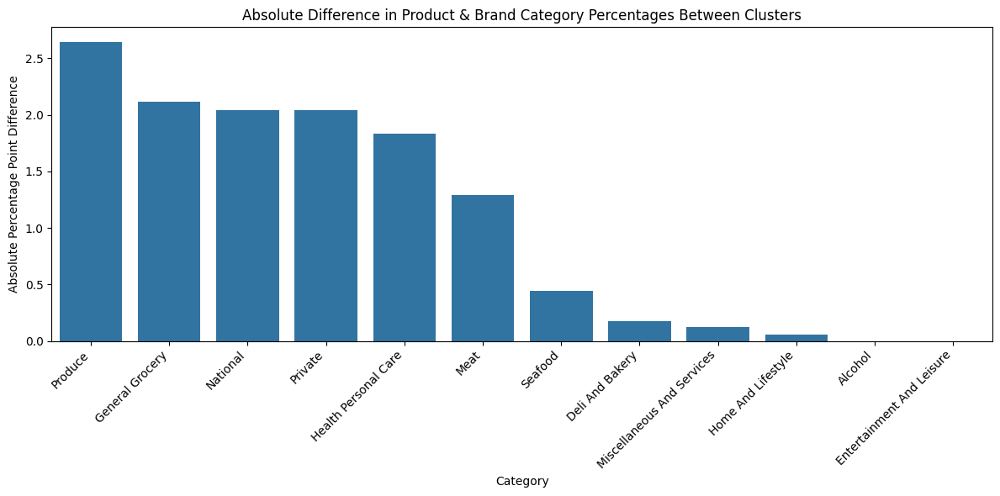

In [91]:
# Create dataframe with absolute differences
# Convert list to DataFrame
product_hierarchical_ward_difference_plot_df = pd.DataFrame(product_hierarchical_ward_plot_data)

# Pivot to wide format
diff_df = product_hierarchical_ward_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference
diff_df['Absolute Difference'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences
diff_df = diff_df.sort_values(
    by='Absolute Difference',
    ascending=False
)

# Plot bar chart (Absolute differences in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Clusters')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are produce, general grocery and national brand. This indicates that these variables contribute most in distinguishing the two clusters.

In [92]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:

- Cluster 1 (more focused on fresh food) has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 2.
- Cluster 2 (more focused on general grocery and health/personal care) has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)

- The largest difference comes from seafood, where Cluster 1 spends 0.4% while Cluster 2 spends 0% (never purchased seafood). Although this is a small absolute difference, the fact that Cluster 2 never buys seafood creates a binary difference, his has large effect on separating the clusters, as shown by a variance score of 2.034.

In [93]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_ward_cluster_proportion = product_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_ward_cluster_proportion)

cluster
1    0.861423
2    0.138577
Name: proportion, dtype: float64


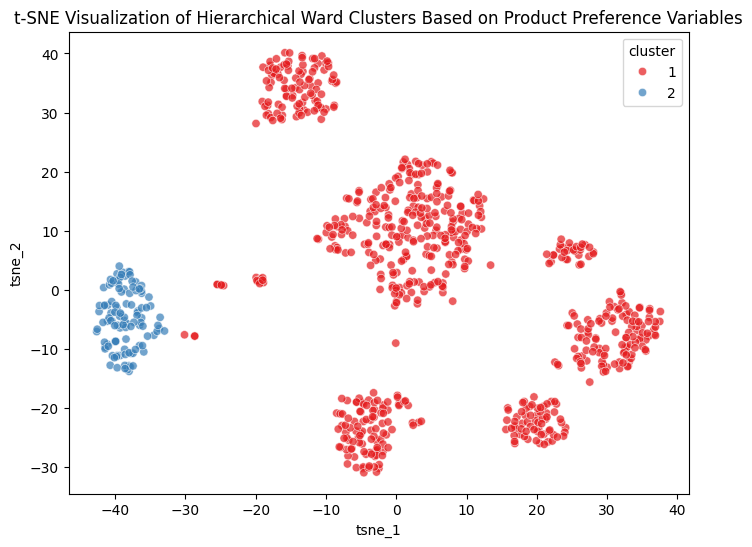

In [94]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on Product Preference Variables')
plt.show()

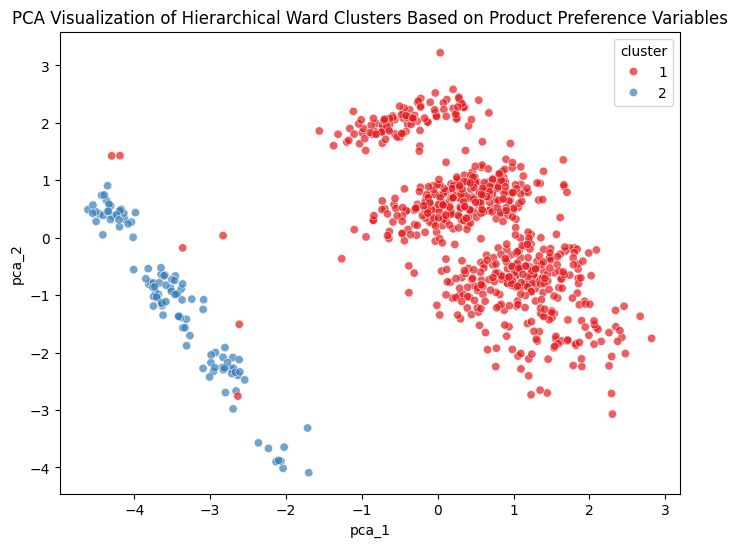

In [95]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on Product Preference Variables')
plt.show()

## Model 27: Hierarchical Clustering (Average Linkage)

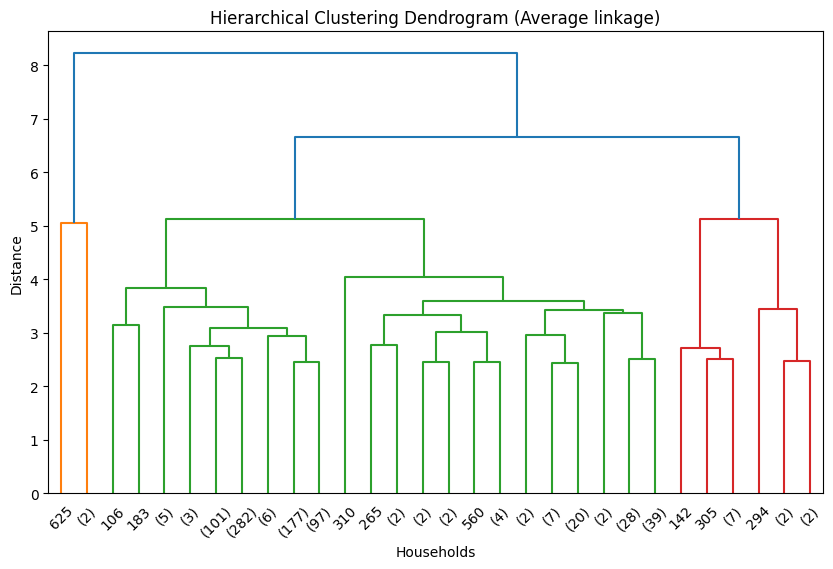

In [96]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Average linkage.
product_hierarchical_average = linkage(product_pca, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [97]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_average_results' for comparison across different k.
product_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(product_pca)

    product_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_average_results_df = pd.DataFrame(product_hierarchical_average_results)
product_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.591296,0.642051,24.452350
1,3,0.509101,0.800242,47.888660
2,4,0.469845,0.680294,35.951749
3,5,0.472197,0.770010,148.893417
4,6,0.471345,0.657617,120.382247
5,7,0.441305,0.644794,101.127905
6,8,0.293976,0.735416,87.711892
7,9,0.280580,0.930480,79.945942
8,10,0.196403,0.961290,72.795598


In [98]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.591296 at k = 2.0
Best Davies-Bouldin Index: 0.642051 at k = 2.0
Best Calinski-Harabasz Index: 148.893417 at k = 5.0


k=2 was selected for hierarchical average clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.591
- it has the lowest Davies-Bouldin Index (DBI) of 0.642

In [99]:
# Create a copy of the dataset to add hierarchical average cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_average_cluster_df = household_profile_df.copy()

In [100]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical average clustering model using k=2
final_k = 2
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=2: 0.591296
Davies-Bouldin Index for k=2: 0.642051
Calinski-Harabasz Index for k=2: 24.452350


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [101]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_average_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_average_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_average_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_average_cluster_summary = pd.DataFrame(product_hierarchical_average_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_average_cluster_summary = product_hierarchical_average_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_average_cluster_summary['cluster'] = range(1, len(product_hierarchical_average_cluster_summary)+1)

# Display the summary
product_hierarchical_average_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,798,0.723999,0.276001,0.000001,0.036323,0.000001,0.637456,0.110220,0.001186,7.077359e-02,0.011581,0.093468,0.003683
1,2,3,0.694624,0.305376,0.000001,0.003135,0.000001,0.683869,0.228839,0.002151,1.000000e-06,0.010610,0.036559,0.002867


In [102]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_average_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category             top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    798         National             0.723999            0.276001 General Grocery Health Personal Care        Produce                       Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.637456     0.110220     0.093468     0.070774     0.036323     0.011581     0.003683     0.001186     0.000001  1.000000e-06
       2      3         National             0.694624            0.305376 General Grocery Health Personal Care        Produce Miscellaneous And Serv

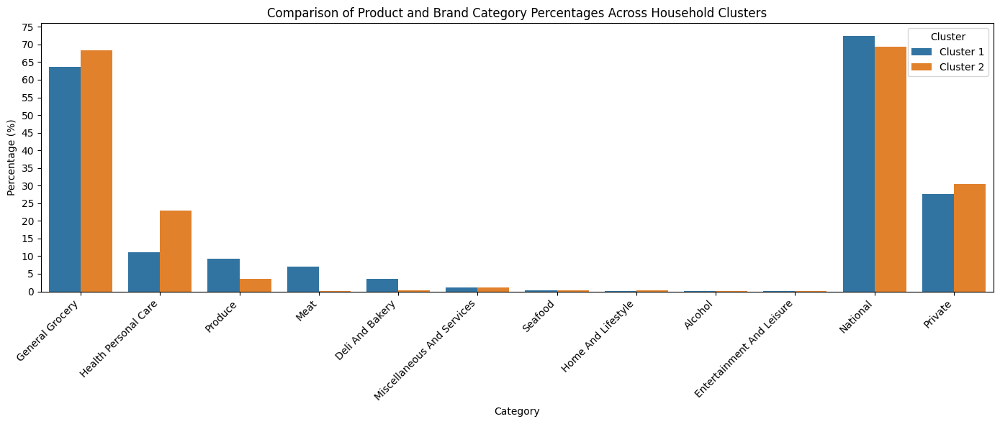

In [103]:
# Convert the cluster insights DataFrame from wide to long format and
# create a row for each cluster-category combination with its corresponding percentage.
product_hierarchical_average_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_hierarchical_average_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_hierarchical_average_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_hierarchical_average_category_cols, product_hierarchical_average_value_cols):
        product_hierarchical_average_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_hierarchical_average_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_hierarchical_average_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_hierarchical_average_plot_df = pd.DataFrame(product_hierarchical_average_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_hierarchical_average_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_hierarchical_average_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

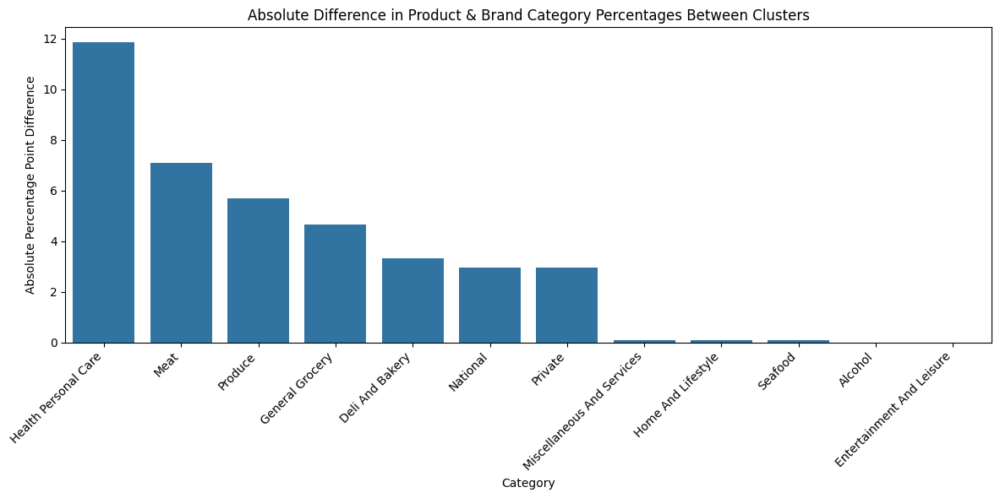

In [104]:
# Create dataframe with absolute differences
# Convert list to DataFrame
product_hierarchical_average_difference_plot_df = pd.DataFrame(product_hierarchical_average_plot_data)

# Pivot to wide format
diff_df = product_hierarchical_average_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference
diff_df['Absolute Difference'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences
diff_df = diff_df.sort_values(
    by='Absolute Difference',
    ascending=False
)

# Plot bar chart (Absolute differences in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Clusters')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are health personal care, meat and produce. This indicates that these variables contribute most in distinguishing the two clusters.

In [105]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:

- Cluster 1 has slightly higher spending on produce, meat, deli & bakery, miscellaneous & services, seafood and and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on general grocery, health/personal care, home & lifestyle and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. alcohol (0.0%)
3. entertainment & leisure. (0.0%)


In [106]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_average_cluster_proportion = product_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_average_cluster_proportion)

cluster
1    0.996255
2    0.003745
Name: proportion, dtype: float64


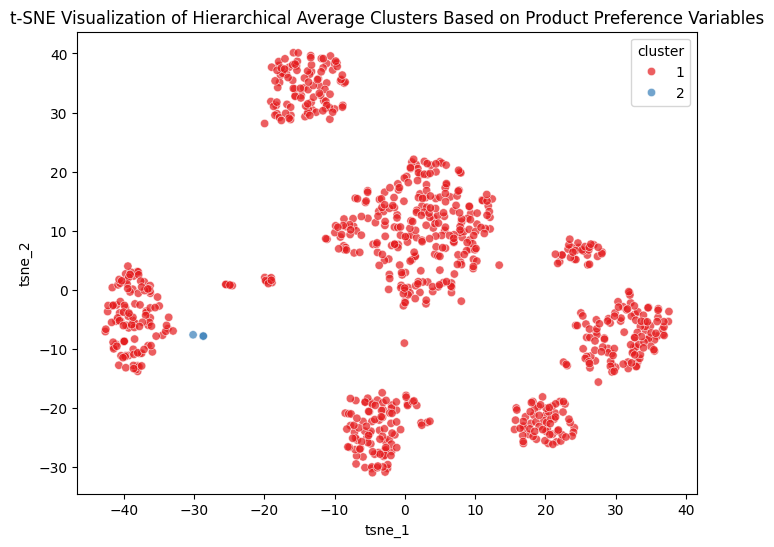

In [107]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on Product Preference Variables')
plt.show()

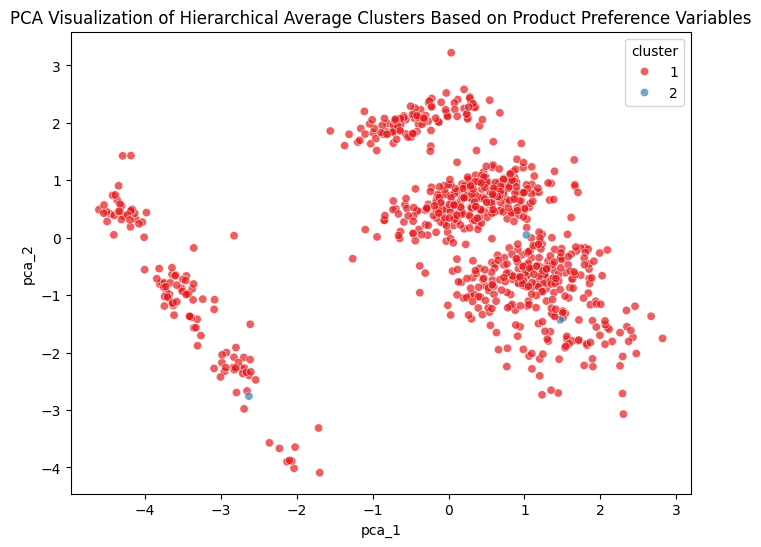

In [108]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on Product Preference Variables')
plt.show()

## Model 28: Hierarchical Clustering (Complete Linkage)

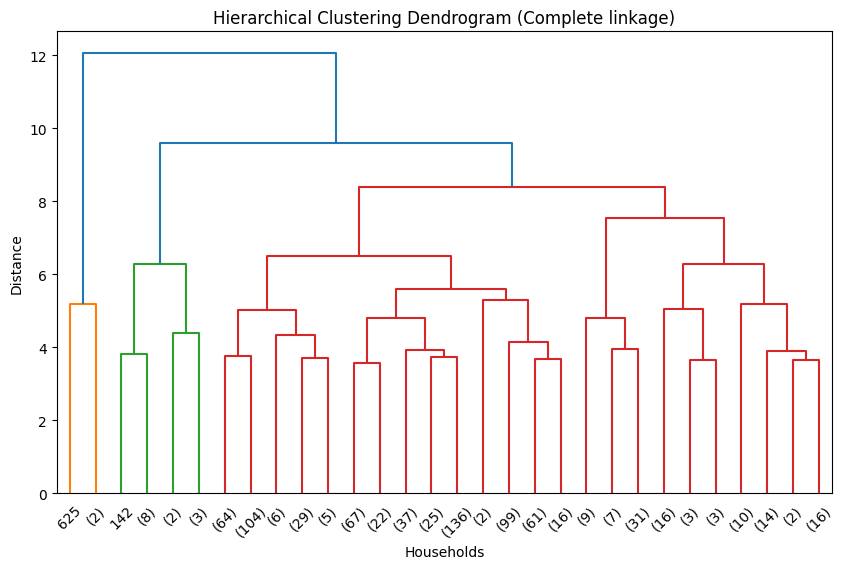

In [109]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Complete linkage.
product_hierarchical_complete = linkage(product_pca, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [110]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_complete_results' for comparison across different k.
product_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(product_pca)

    product_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_complete_results_df = pd.DataFrame(product_hierarchical_complete_results)
product_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.591296,0.642051,24.452350
1,3,0.509101,0.800242,47.888660
2,4,0.472465,0.808132,189.202872
3,5,0.412914,1.232947,152.434396
4,6,0.231566,1.371355,195.914340
5,7,0.234010,1.268969,171.211718
6,8,0.235198,1.265331,155.509758
7,9,0.138987,1.525762,153.926173
8,10,0.134981,1.454546,138.400370


In [111]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.591296 at k = 2.0
Best Davies-Bouldin Index: 0.642051 at k = 2.0
Best Calinski-Harabasz Index: 195.914340 at k = 6.0


k=2 was selected for hierarchical complete clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.576
- it has the lowest Davies-Bouldin Index (DBI) of 0.642

In [112]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_complete_cluster_df = household_profile_df.copy()

In [113]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.591296
Davies-Bouldin Index for k=2: 0.642051
Calinski-Harabasz Index for k=2: 24.452350


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [114]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_complete_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_complete_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_complete_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_complete_cluster_summary = pd.DataFrame(product_hierarchical_complete_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_complete_cluster_summary = product_hierarchical_complete_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_complete_cluster_summary['cluster'] = range(1, len(product_hierarchical_complete_cluster_summary)+1)

# Display the summary
product_hierarchical_complete_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,798,0.723999,0.276001,0.000001,0.036323,0.000001,0.637456,0.110220,0.001186,7.077359e-02,0.011581,0.093468,0.003683
1,2,3,0.694624,0.305376,0.000001,0.003135,0.000001,0.683869,0.228839,0.002151,1.000000e-06,0.010610,0.036559,0.002867


In [115]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_complete_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category             top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    798         National             0.723999            0.276001 General Grocery Health Personal Care        Produce                       Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.637456     0.110220     0.093468     0.070774     0.036323     0.011581     0.003683     0.001186     0.000001  1.000000e-06
       2      3         National             0.694624            0.305376 General Grocery Health Personal Care        Produce Miscellaneous And Serv

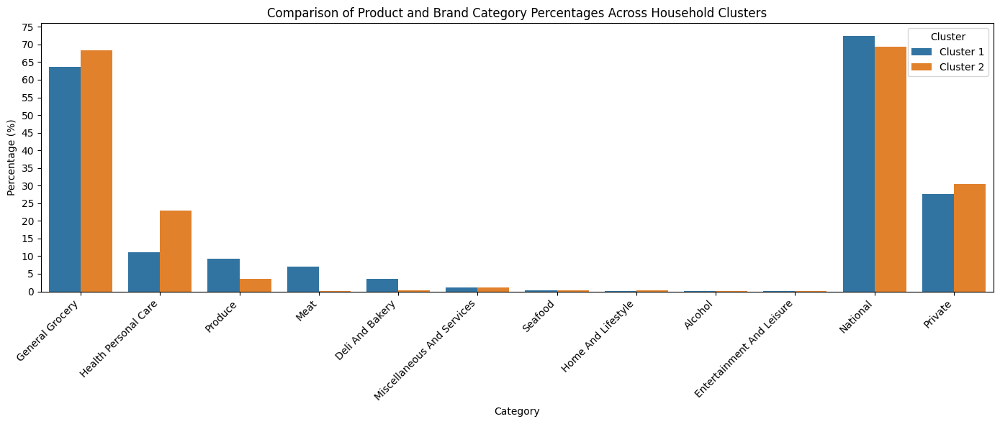

In [116]:
# Convert the cluster insights DataFrame from wide to long format and
# create a row for each cluster-category combination with its corresponding percentage.
product_hierarchical_complete_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_hierarchical_complete_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_hierarchical_complete_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_hierarchical_complete_category_cols, product_hierarchical_complete_value_cols):
        product_hierarchical_complete_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_hierarchical_complete_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_hierarchical_complete_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_hierarchical_complete_plot_df = pd.DataFrame(product_hierarchical_complete_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_hierarchical_complete_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_hierarchical_complete_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

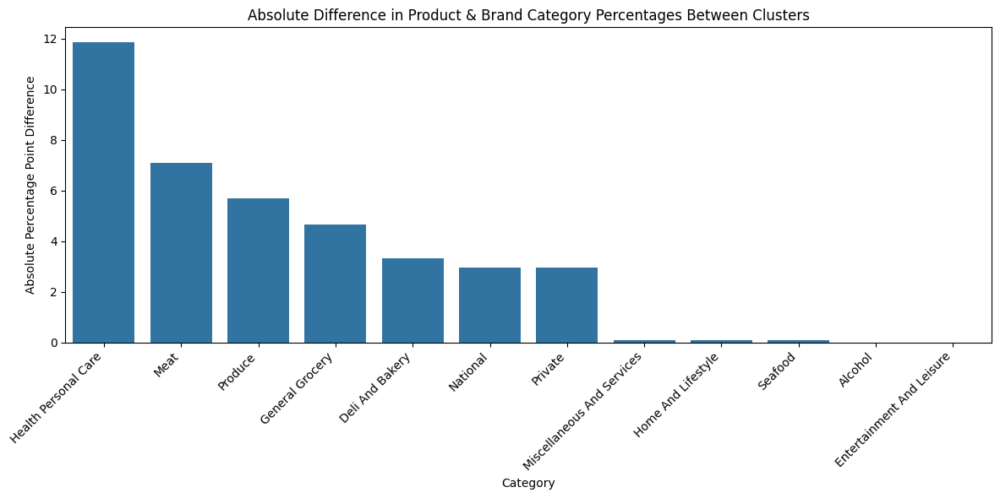

In [117]:
# Create dataframe with absolute differences
# Convert list to DataFrame
product_hierarchical_complete_difference_plot_df = pd.DataFrame(product_hierarchical_complete_plot_data)

# Pivot to wide format
diff_df = product_hierarchical_complete_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference
diff_df['Absolute Difference'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences
diff_df = diff_df.sort_values(
    by='Absolute Difference',
    ascending=False
)

# Plot bar chart (Absolute differences in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Clusters')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are health personal care, meat and produce. This indicates that these variables contribute most in distinguishing the two clusters.

In [118]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:

- Cluster 1 has slightly higher spending on produce, meat, deli & bakery, miscellaneous & services, seafood and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on general grocery, health/personal care, home & lifestyle and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. alcohol (0.0%)
3. entertainment & leisure. (0.0%).


In [119]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_complete_cluster_proportion = product_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_complete_cluster_proportion)

cluster
1    0.996255
2    0.003745
Name: proportion, dtype: float64


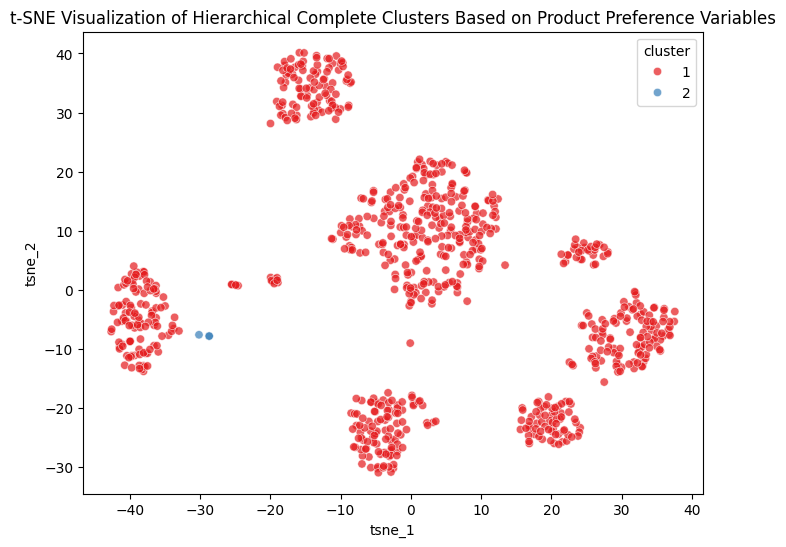

In [120]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on Product Preference Variables')
plt.show()

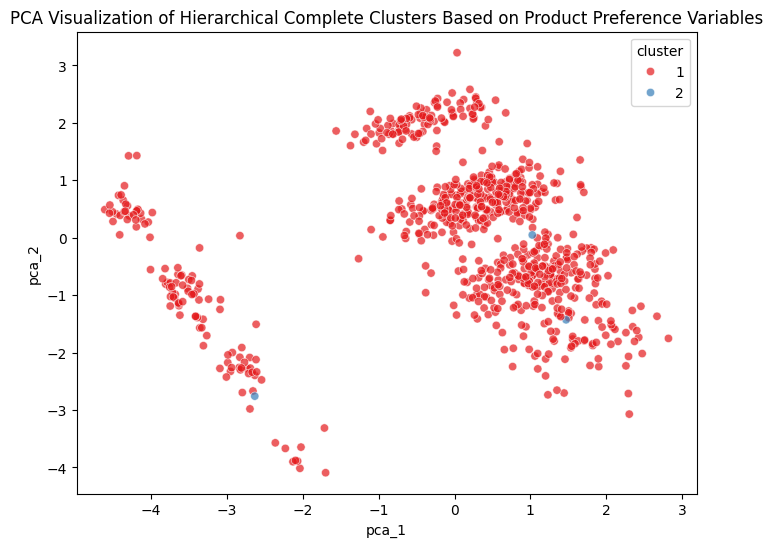

In [121]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on Product Preference Variables')
plt.show()

## Model 29: DBSCAN

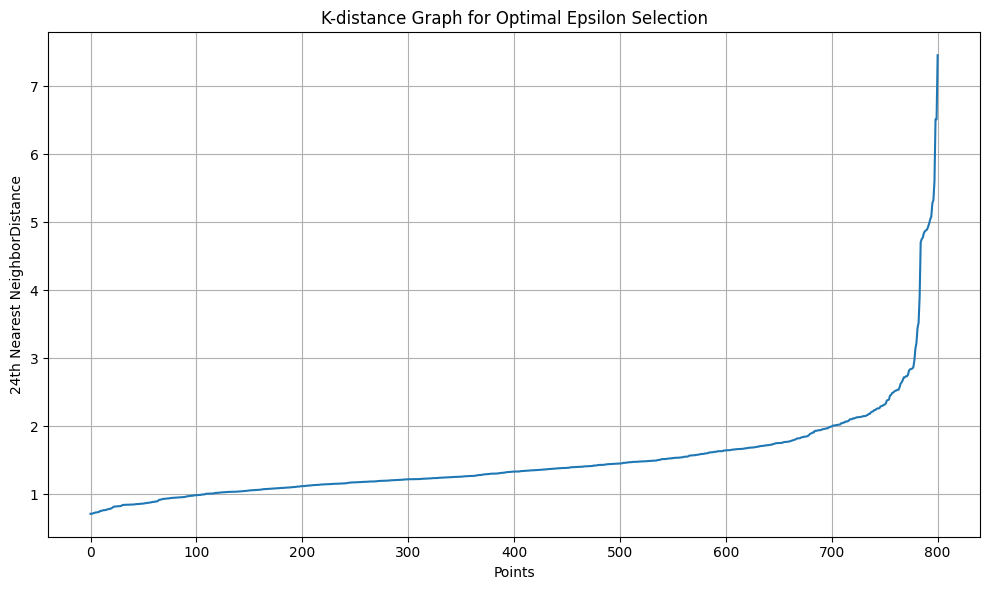

In [122]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 12 variables ('national_proportion', 'private_proportion', 'alcohol_proportion', 'deli & bakery_proportion',
# 'entertainment & leisure_proportion', 'general_grocery_proportion', 'health_personal_care_proportion', '
# home & lifestyle_proportion', 'meat_proportion', 'miscellaneous & services_proportion', 'produce_proportion'
# and'seafood_proportion' variables, so n_neighbors / min_samples = 24.

# Calculate distances to the 24 nearest neighbors for each point.
# The distance to the 24th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 24
product_neighbors = NearestNeighbors(n_neighbors=k).fit(product_pca)
distances, indices = product_neighbors.kneighbors(product_pca)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 3.0.

In [123]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Define parameter ranges for DBSCAN
eps_range = [1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8]
min_samples_range = [23, 24, 25]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_dbscan_results'
# for comparison across different eps range and minimum samples range.
product_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering on 'product_pca'
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(product_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = product_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(product_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        product_dbscan_results.append(result)

# Convert to DataFrame
product_dbscan_results_df = pd.DataFrame(product_dbscan_results)
product_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,1.6,23,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
1,1.6,24,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
2,1.6,25,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
3,1.8,23,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
4,1.8,24,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
5,1.8,25,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
6,2.0,23,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
7,2.0,24,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
8,2.0,25,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
9,2.2,23,2,23,0.028714,0.677598,0.474676,0.902137,421.644168


In [124]:
# Highest DBCV Score
best_dbcv_idx = product_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = product_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = product_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = product_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.681737 at eps = 2.0, min_samples = 23.0
Best Silhouette Score: 0.481994 at eps = 1.8, min_samples = 23.0
Best Davies-Bouldin Index: 0.690409 at eps = 1.6, min_samples = 23.0
Best Calinski-Harabasz Index: 427.630791 at eps = 2.6, min_samples = 23.0


We tested with different epsilon values (1.6, 1.8, 2.0, 2.2, 2.4, 2.6 & 2.8) and minimum samples values (23, 24 & 25).

eps_range = [1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8]
min_samples_range = [23, 24, 25]


eps=2.0 and min_sample = 23 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio of 0.035
- High DBCV score of 0.681
- High Silhouette score of 0.476
- Low Davies-Bouldin index of 0.890
- High Calinski-Harabasz index  of 412.985

In [125]:
# Create a copy of the dataset to add DBSCAN cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_dbscan_cluster_df = household_profile_df.copy()

In [147]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 2.0
best_min_samples = 23
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(product_pca)

# Add cluster labels to the 'product_dbscan_cluster_df'
product_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.4 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = product_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(product_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_dbscan_cluster_df.head(5)

Number of clusters for eps=2.0 & min_samples=23: 2
Number of noise for eps=2.0 & min_samples=23: 28
Noise ratio for eps=2.0 & min_samples=23: 0.034956
DBCV Score for eps=2.0 & min_samples=23: 0.681737
Silhouette Score for eps=2.0 & min_samples=23: 0.475503
Davies-Bouldin Index for eps=2.0 & min_samples=23: 0.890242
Calinski-Harabasz Index for eps=2.0 & min_samples=23: 412.984914


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1,-36.803398,-3.615456,-3.807593,-0.808053
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2,-2.887683,16.509840,-0.576041,0.576502
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2,28.881777,-9.930691,1.289474,-1.101559
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.

In [127]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_dbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_dbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_dbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_dbscan_cluster_summary = pd.DataFrame(product_dbscan_cluster_summary)

# Display the summary
product_dbscan_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,0,20,0.719287,0.280713,1.000000e-06,0.037473,1.000000e-06,0.612624,0.131983,0.000001,0.064363,0.000001,0.068223,2.499947e-03
1,1,108,0.740971,0.259029,1.000000e-06,0.034837,1.000000e-06,0.657524,0.127044,0.000700,0.060761,0.012560,0.070668,1.000000e-06
2,2,673,0.722426,0.277574,1.000000e-06,0.036318,1.000000e-06,0.636819,0.108696,0.001244,0.072799,0.011696,0.097146,4.405282e-03


Note: Cluser 0 is noise.

In [128]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_dbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category             top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       0     20         National             0.719287            0.280713 General Grocery Health Personal Care        Produce           Meat Deli And Bakery                    Seafood Home And Lifestyle Miscellaneous And Services        Alcohol Entertainment And Leisure     0.612624     0.131983     0.068223     0.064363     0.037473     0.002500     0.000001     0.000001 1.000000e-06  1.000000e-06
       1    108         National             0.740971            0.259029 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous

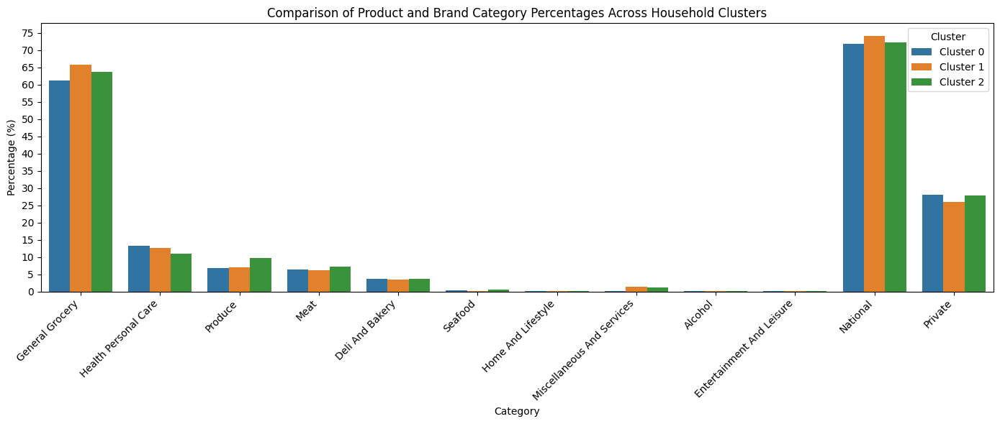

In [129]:
# Convert the cluster insights DataFrame from wide to long format and
# Creating a row for each cluster-category combination with its corresponding percentage.
product_dbscan_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_dbscan_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_dbscan_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_dbscan_category_cols, product_dbscan_value_cols):
        product_dbscan_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_dbscan_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_dbscan_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_dbscan_plot_df = pd.DataFrame(product_dbscan_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_dbscan_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_dbscan_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

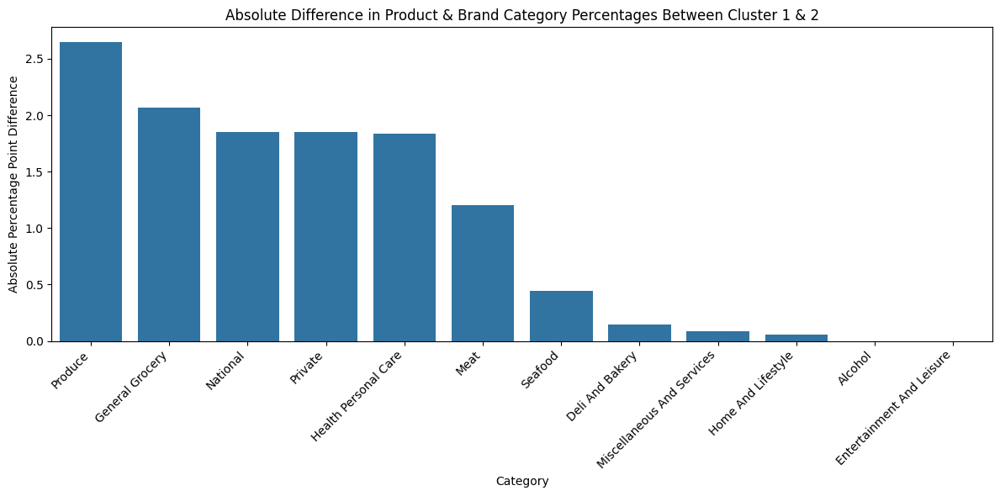

In [130]:
# Create dataframe with absolute differences between cluster 1 and 2
# Convert list to DataFrame
product_dbscan_difference_plot_df = pd.DataFrame(product_dbscan_plot_data)

# Pivot to wide format
diff_df = product_dbscan_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference between cluster 1 and 2
diff_df['Absolute Difference Between Cluster 1 And 2'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences between cluster 1 and 2
diff_df = diff_df.sort_values(
    by='Absolute Difference Between Cluster 1 And 2',
    ascending=False
)

# Plot bar chart (Absolute differences between cluster 1 and 2 in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference Between Cluster 1 And 2'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Cluster 1 & 2')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are produce, general grocery and national. This indicates that these variables contribute most in distinguishing the two clusters.

In [131]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:

- Cluster 1 has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)

- The largest difference comes from seafood, where Cluster 2 spends 0.4% while Cluster 1 spends 0% (never purchased seafood). Although this is a small absolute difference, the fact that Cluster 2 never buys seafood creates a binary difference, this has large effect on separating the clusters, as shown by a variance score of 2.034.

In [132]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_dbscan_cluster_proportion = product_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_dbscan_cluster_proportion)

cluster
0    0.024969
1    0.134831
2    0.840200
Name: proportion, dtype: float64


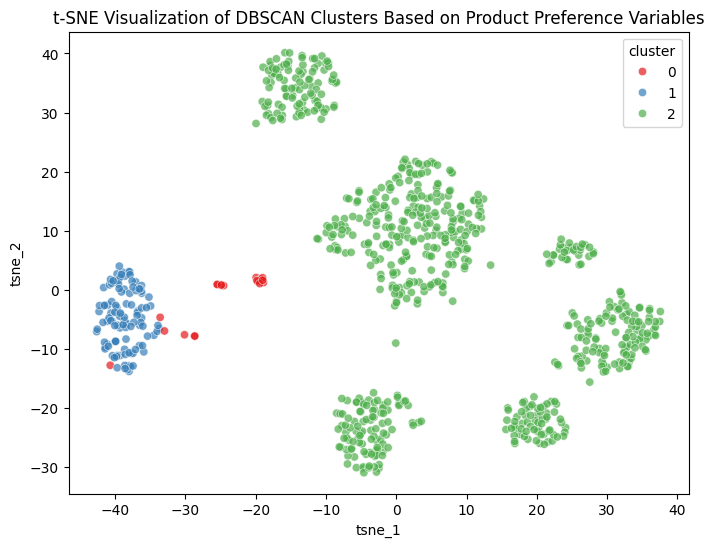

In [133]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_dbscan_cluster_df'
product_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
product_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on Product Preference Variables')
plt.show()

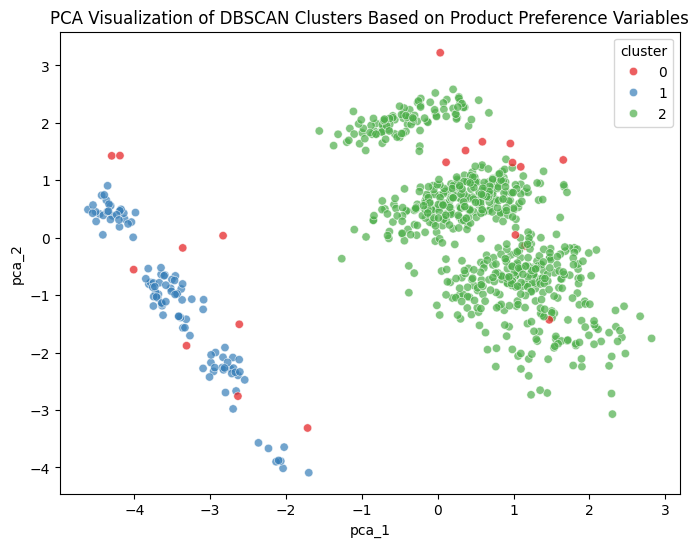

In [134]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_dbscan_df'
product_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
product_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Product Preference Variables')
plt.show()

## Model 30: HDBSCAN

In [135]:
# For HDBSCAN, min_cluster_size is the minimum number of points requried to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 20, 30, 50, 75, 100]
min_samples_range = [1, 5, 10, 15, 20]

# Store results
product_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        product_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = product_hdbscan.fit_predict(product_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = product_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(product_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        product_hdbscan_results.append(result)

# Convert to DataFrame
product_hdbscan_results_df = pd.DataFrame(product_hdbscan_results)
product_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,8,23,0.028714,0.662253,0.399359,1.088417,86.107007
1,5,5,3,10,0.012484,0.688068,0.473819,0.836348,252.963367
2,5,10,2,21,0.026217,0.677225,0.474625,0.914251,427.205410
3,5,15,2,27,0.033708,0.682574,0.475207,0.894011,414.760753
4,5,20,2,32,0.039950,0.678388,0.475351,0.879905,401.816001
5,10,1,3,3,0.003745,0.679590,0.472538,0.885797,264.398081
6,10,5,3,10,0.012484,0.688068,0.473819,0.836348,252.963367
7,10,10,2,21,0.026217,0.677225,0.474625,0.914251,427.205410
8,10,15,2,27,0.033708,0.682574,0.475207,0.894011,414.760753
9,10,20,2,32,0.039950,0.678388,0.475351,0.879905,401.816001


**Different min_cluster_size values (5, 10, 15, 20) when paired with the same min_samples have identical validation results.**
<br>
The validation metrics show identical results for different min_cluster_size values (5, 10, 15) when paired with the same min_samples values because the clusters formed by HDBSCAN are large enough (with many data points) to satisfy all these min_cluster_size thresholds. As a result, changing min_cluster_size within this range does not affect the clustering structure and validation results.

If a potential cluster does not satisfy the min_cluster_size requirement, HDBSCAN labels those points as noise (labeled as -1) rather than forming clusters, which affects the validation results by excluding these points from the validation calculations.
<br>
<br>

**min_samples values increases, the n_noise (number of noises) increases.**
<br>
We also noticed that when min_samples values increases, the n_noise (number of noises) increases.
- Low min_samples: Lenient clustering, more core points, less noise, but might include outliers in the clusters.
- High min_samples: Tight clusterring, less core points, more noise, but less outliers in the clusters (more robust).


For example: imagine a data point with 5 neighbors
- If min_samples = 3, this data point is a core point because it has 5 neighbors, which exceeds the requirement of 3.
- If min_samples = 8, this data point is not a core point because it has only 5 neighbors, which is less than the requirement of 8
- With higher min_samples, there are fewer core points, clusters become smaller, and more points fail to be reachable from any core point. These points are then labeled as noise.

In [136]:
# Highest DBCV Score
best_dbcv_idx = product_hdbscan_results_df['dbcv_score'].idxmax()
best_dbcv = product_hdbscan_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = product_hdbscan_results_df['silhouette_score'].idxmax()
best_silhouette = product_hdbscan_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hdbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hdbscan_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hdbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hdbscan_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.688068 at min_cluster_size = 5.0, min_samples = 5.0
Best Silhouette Score: 0.475351 at min_cluster_size = 5.0, min_samples = 20.0
Best Davies-Bouldin Index: 0.836348 at min_cluster_size = 5.0, min_samples = 5.0
Best Calinski-Harabasz Index: 429.879496 at min_cluster_size = 50.0, min_samples = 1.0


min_cluster_size = 5.0, min_samples = 10.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 2 (It is simple for interpretation for product preference variables.)
- Low noise ratio equal to 0.0262
- Highest DBCV score at 0.677
- Moderate Silhouette score of 0.475 and Davies-Bouldin index of 0.914.
- Second highest Calinski-Harabasz index of 427.205.

In [137]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on product preference variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hdbscan_cluster_df = household_profile_df.copy()

In [138]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 10
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(product_pca)

# Add cluster labels to the dataframe
product_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = product_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(product_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=10: 2
Number of noise for min_cluster_size=5 & min_samples=10: 21
Noise ratio for min_cluster_size=5 & min_samples=10: 0.026217
DBCV Score for min_cluster_size=5 & min_samples=10: 0.677225
Silhouette Score for min_cluster_size=5 & min_samples=10: 0.474625
Davies-Bouldin Index for min_cluster_size=5 & min_samples=10: 0.914251
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=10: 427.205410


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [139]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hdbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hdbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hdbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hdbscan_cluster_summary = pd.DataFrame(product_hdbscan_cluster_summary)

# Display the summary
product_hdbscan_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,0,21,0.730241,0.269759,1.000000e-06,0.037135,1.000000e-06,0.612715,0.131498,0.000001,0.064935,0.000001,0.066985,2.607557e-03
1,1,108,0.740971,0.259029,1.000000e-06,0.034837,1.000000e-06,0.657524,0.127044,0.000700,0.060761,0.012560,0.070668,1.000000e-06
2,2,672,0.722357,0.277643,1.000000e-06,0.036323,1.000000e-06,0.636607,0.109001,0.001247,0.072718,0.011707,0.097217,4.413803e-03


Note: Cluser 0 is noise.

In [140]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hdbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category             top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       0     21         National             0.730241            0.269759 General Grocery Health Personal Care        Produce           Meat Deli And Bakery                    Seafood Home And Lifestyle Miscellaneous And Services        Alcohol Entertainment And Leisure     0.612715     0.131498     0.066985     0.064935     0.037135     0.002608     0.000001     0.000001 1.000000e-06  1.000000e-06
       1    108         National             0.740971            0.259029 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous

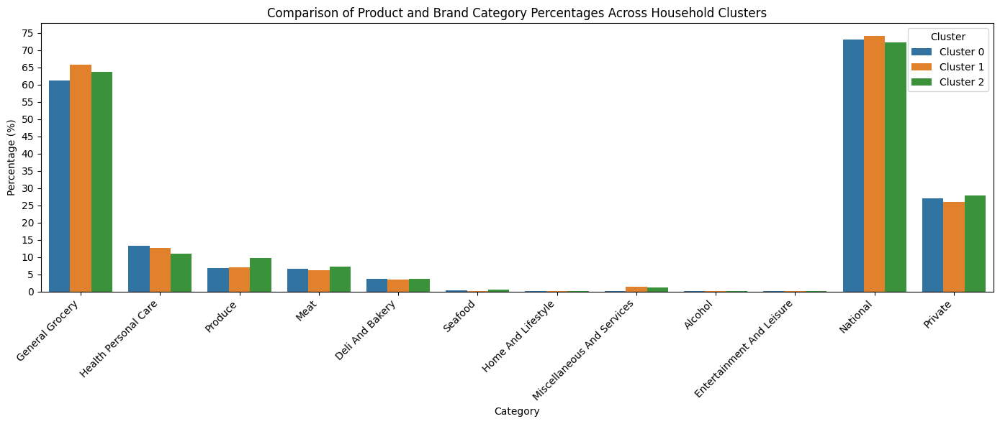

In [141]:
# Convert the cluster insights DataFrame from wide to long format and
# Creating a row for each cluster-category combination with its corresponding percentage.
product_hdbscan_category_cols = [f'top_{i}_category' for i in range(1, 11)]
product_hdbscan_value_cols = [f'top_{i}_value' for i in range(1, 11)]

product_hdbscan_plot_data = []

for _, row in cluster_insights_df.iterrows():
    cluster_name = f"Cluster {int(row['cluster'])}"

    # Add product categories
    for cat_col, val_col in zip(product_hdbscan_category_cols, product_hdbscan_value_cols):
        product_hdbscan_plot_data.append({
            'Cluster': cluster_name,
            'Category': row[cat_col],
            'Percentage': row[val_col] * 100
        })

    # Add brand proportions
    product_hdbscan_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'National',
        'Percentage': row['national_proportion'] * 100
    })
    product_hdbscan_plot_data.append({
        'Cluster': cluster_name,
        'Category': 'Private',
        'Percentage': row['private_proportion'] * 100
    })

# Convert to DataFrame
product_hdbscan_plot_df = pd.DataFrame(product_hdbscan_plot_data)

# Plot bar chart
plt.figure(figsize=(14, 6))
sns.barplot(data=product_hdbscan_plot_df, x='Category', y='Percentage', hue='Cluster')
plt.title('Comparison of Product and Brand Category Percentages Across Household Clusters')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
max_val = np.ceil(product_hdbscan_plot_df['Percentage'].max() / 5) * 5
plt.yticks(np.arange(0, max_val + 5, 5))
plt.tight_layout()
plt.show()

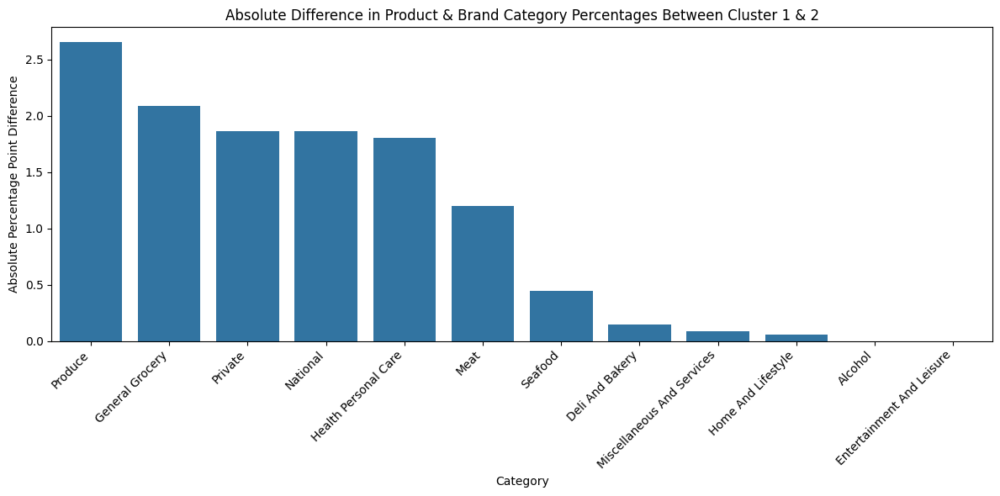

In [142]:
# Create dataframe with absolute differences between cluster 1 and 2
# Convert list to DataFrame
product_hdbscan_difference_plot_df = pd.DataFrame(product_hdbscan_plot_data)

# Pivot to wide format
diff_df = product_hdbscan_difference_plot_df.pivot(
    index='Category',
    columns='Cluster',
    values='Percentage'
).reset_index()

# Calculate absolute difference between cluster 1 and 2
diff_df['Absolute Difference Between Cluster 1 And 2'] = (
    diff_df['Cluster 1'] - diff_df['Cluster 2']
).abs()

# Sort descending by absolute differences between cluster 1 and 2
diff_df = diff_df.sort_values(
    by='Absolute Difference Between Cluster 1 And 2',
    ascending=False
)

# Plot bar chart (Absolute differences between cluster 1 and 2 in descending order)
plt.figure(figsize=(12, 6))
sns.barplot(
    data=diff_df,
    x='Category',
    y='Absolute Difference Between Cluster 1 And 2'
)

plt.title('Absolute Difference in Product & Brand Category Percentages Between Cluster 1 & 2')
plt.ylabel('Absolute Percentage Point Difference')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

The three product categories with the largest absolute percentage differences between cluster 1 and cluster 2 are produce, general grocery and private. This indicates that these variables contribute most in distinguishing the two clusters.

In [143]:
# Calculate variances and sort product preference variables in descending order.
# List of feature names corresponding to columns in 'product_array'
feature_names = [
    'National', 'Alcohol', 'Deli_Bakery', 'Entertainment_Leisure',
    'General_Grocery', 'Health_Personal_Care', 'Home_Lifestyle', 'Meat',
    'Misc_Services', 'Produce', 'Seafood'
]

# Convert NumPy array to DataFrame with column names
product_features_df = pd.DataFrame(product_array, columns=feature_names)

# Calculate and sort the variances in descending order.
product_variance_df = product_features_df.var().sort_values(ascending=False)
print("Top features by variance:")
print(product_variance_df.head(15))

print("\n" + "="*50 + "\n")

# Descriptive statistics for all features
print("Descriptive statistics of all features:")
product_features_df.describe()

Top features by variance:
Seafood                  2.033971
Misc_Services            0.925239
Meat                     0.795413
National                 0.629658
Health_Personal_Care     0.621591
Deli_Bakery              0.619534
Produce                  0.569722
General_Grocery          0.543051
Alcohol                  0.316555
Entertainment_Leisure    0.299447
Home_Lifestyle           0.258119
dtype: float64


Descriptive statistics of all features:


,National,Alcohol,Deli_Bakery,Entertainment_Leisure,General_Grocery,Health_Personal_Care,Home_Lifestyle,Meat,Misc_Services,Produce,Seafood
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000
mean,0.035690,0.264707,0.024345,0.258046,-0.003568,0.079523,-0.220018,-0.052357,-0.067335,0.041658,-0.438793
std,0.793510,0.562632,0.787105,0.547218,0.736920,0.788411,0.508054,0.891859,0.961894,0.754799,1.426174
min,-2.359744,-0.357039,-2.227581,-0.364700,-1.917211,-2.122818,-1.236457,-7.431692,-5.630763,-2.540730,-4.532460
25%,-0.475622,-0.139036,-0.507539,-0.131827,-0.542217,-0.435961,-0.848294,-0.549246,-0.497023,-0.483027,-0.572386
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.524378,0.860964,0.492461,0.868173,0.457783,0.564039,0.151706,0.450754,0.502977,0.516973,0.427614
max,2.637261,1.794519,2.692153,1.727076,2.162826,3.150058,0.635300,2.642738,2.054919,2.952468,1.518881


The similar product preference ranking order and small percentage differences between 2 clusters across most product categories indicate that 2 clusters have similar overall shopping patterns. However, they are still moderately different from each other. Based on the cluster profiles:

- Cluster 1 has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)
The largest difference comes from seafood, where Cluster 2 spends 0.4% while Cluster 1 spends 0% (never purchased seafood). Although this is a small absolute difference, the fact that Cluster 2 never buys seafood creates a binary difference, this has large effect on separating the clusters, as shown by a variance score of 2.034.

In [144]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hdbscan_cluster_proportion = product_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hdbscan_cluster_proportion)

cluster
0    0.026217
1    0.134831
2    0.838951
Name: proportion, dtype: float64


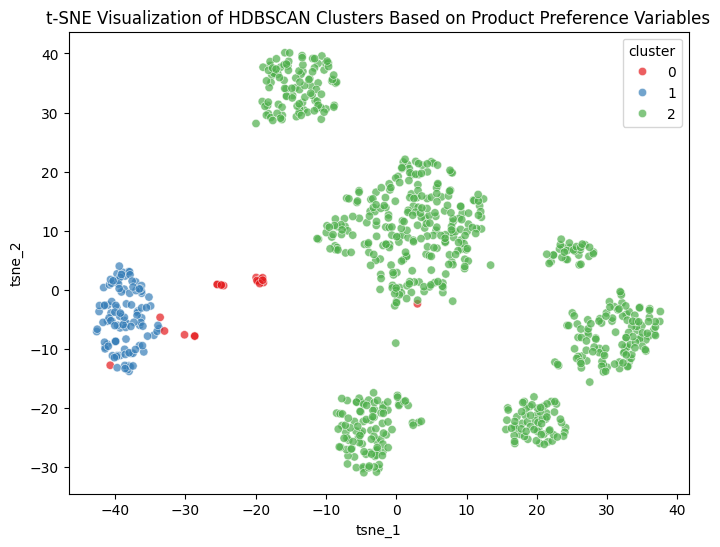

In [145]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hdbscan_cluster_df'
product_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on Product Preference Variables')
plt.show()

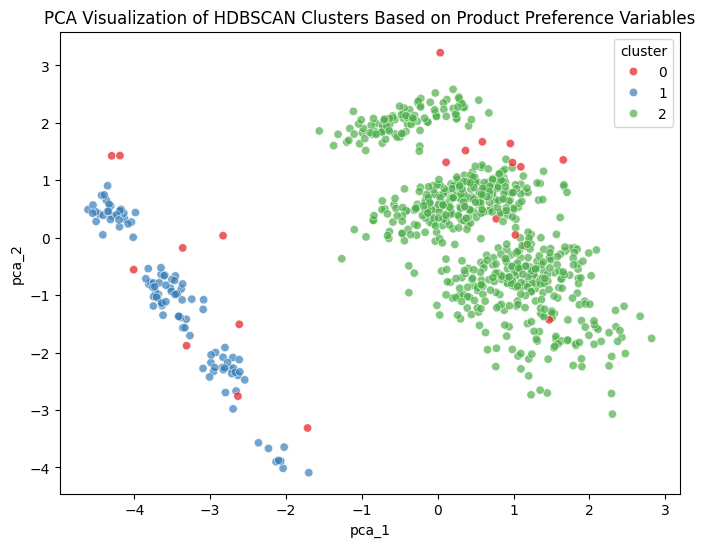

In [146]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_Hdbscan_df'
product_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
product_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of HDBSCAN Clusters Based on Product Preference Variables')
plt.show()

## Model 31: Gaussian Mixture Model

## Model 32: Self Organizing Maps